# Section A: Model

In [1]:
import os
import sys
import gc
import time
import pickle
import pandas as pd
# import datetime


from pathlib import Path

import math
import random
import colorsys
import webcolors



import cv2
import numpy as np
import pandas as pd
from datetime import datetime
from typing import List, Tuple
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.gridspec as gridspec
from plotly.subplots import make_subplots


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize, LabelBinarizer
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, roc_auc_score, precision_recall_curve, average_precision_score

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers, regularizers, mixed_precision
from tensorflow.keras.applications import InceptionV3, ResNet50, ResNet101, InceptionResNetV2, VGG16
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, LearningRateScheduler, ModelCheckpoint
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, UpSampling2D, concatenate, Activation,GlobalAveragePooling2D, BatchNormalization, LeakyReLU

## File I/O and OS

In [ ]:
def file_count(folder):
    count = 0
    for root, dirs, files in os.walk(folder):
        count += len([f for f in files if os.path.isfile(os.path.join(root, f))])
    return count



In [1]:
import nbimporter
import import_ipynb


import os
import sys

def add_path_to_sys(path):
    module_path = os.path.abspath(path)
    if module_path not in sys.path:
        sys.path.append(module_path)

usePath = os.path.join(r'c:', os.sep,'Users','scrwh','Documents','PythonScripts')
add_path_to_sys(usePath)


import ModelsListDiffFuntions
from ModelsListDiffFuntions import *

# List all the functions defined in the other notebook
print(dir(ModelsListDiffFuntions))

['AbstractRNNCell', 'Activation', 'ActivityRegularization', 'Adam', 'Add', 'AdditiveAttention', 'AlphaDropout', 'Attention', 'Average', 'AveragePooling1D', 'AveragePooling2D', 'AveragePooling3D', 'AvgPool1D', 'AvgPool2D', 'AvgPool3D', 'BatchNormalization', 'Bidirectional', 'CategoryEncoding', 'CenterCrop', 'Concatenate', 'ConfusionMatrixDisplay', 'Conv1D', 'Conv1DTranspose', 'Conv2D', 'Conv2DTranspose', 'Conv3D', 'Conv3DTranspose', 'ConvLSTM1D', 'ConvLSTM2D', 'ConvLSTM3D', 'Convolution1D', 'Convolution1DTranspose', 'Convolution2D', 'Convolution2DTranspose', 'Convolution3D', 'Convolution3DTranspose', 'Cropping1D', 'Cropping2D', 'Cropping3D', 'Dense', 'DenseFeatures', 'DepthwiseConv1D', 'DepthwiseConv2D', 'DetCurveDisplay', 'Discretization', 'DistanceMetric', 'Dot', 'Dropout', 'ELU', 'EarlyStopping', 'EinsumDense', 'Embedding', 'EvaluateTest', 'FileTree', 'Flatten', 'FolderTree', 'GPUtil', 'GRU', 'GRUCell', 'GaussianDropout', 'GaussianNoise', 'GlobalAveragePooling1D', 'GlobalAveragePooli

### Useful Rmarkdown link
- https://eddjberry.netlify.app/post/writing-your-thesis-with-bookdown/

## Functions

In [2]:
def file_count(folder):
    count = 0
    for root, dirs, files in os.walk(folder):
        count += len([f for f in files if os.path.isfile(os.path.join(root, f))])
    return count

def sample_list(trend, lists, size):
    data_list = [file for file in lists if trend in file]
    return random.sample(data_list, size)

def get_file_list(data_folder):
    return [os.path.join(dirpath, file) for dirpath, dirnames, files in os.walk(data_folder) for file in files]

def generate_data(path, size, batch_size, class_mode, seed):
    data = ImageDataGenerator(rescale=1/255)
    return data.flow_from_directory(path,
                                    target_size=(size, size),
                                    batch_size=batch_size,
                                    class_mode=class_mode,
                                    seed=seed)


def plot_image_grid(imglist):
    rows = 3 if len(imglist) < 7 else 4
    numm = math.ceil(len(imglist) / rows)
    dim = (256, 256)

    plt.figure(figsize=(20, 15))
    gs1 = gridspec.GridSpec(numm, rows)
    gs1.update(wspace=0.025, hspace=0.08)

    for idx, img_path in enumerate(imglist):
        shp = Image.open(img_path).size
        title = f'Image{idx} {shp}'
        img = Image.open(img_path).resize(dim)
        ax1 = plt.subplot(gs1[idx])
        plt.title(title)
        plt.grid(False)
        plt.axis('on')
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        plt.imshow(img)



def FolderTree(FolderPath):
    for root, dirs, files in os.walk(FolderPath):
        level = root.replace(FolderPath, '').count(os.sep)
        indent = ' ' * 4 * level
        print('{}{}/'.format(indent, os.path.basename(root)))
        subindent = ' ' * 4 * (level + 1)
        num_files = len(files)
        print('{}{} file(s)'.format(subindent, num_files))
        
        
def calculate_steps_per_epoch_and_epochs(num_samples, desired_epochs):
    batch_size = 128  # example batch size
    steps_per_epoch = num_samples // batch_size + 1
    epochs = desired_epochs
    while steps_per_epoch * epochs < num_samples:
        epochs += 1
    return steps_per_epoch, epochs

def calculate_batch_size_steps_per_epoch_and_epochs(sample, desired_epochs):
    num_samples = len(sample)
    batch_size = train_generator.batch_size
    steps_per_epoch = num_samples // batch_size + 1
    epochs = desired_epochs
    while steps_per_epoch * epochs < num_samples:
        epochs += 1
    return batch_size, steps_per_epoch, epochs

def calculate_batch_size_steps_per_epoch_and_epochsb(train_generator, desired_epochs):
    num_samples = train_generator.samples
    batch_size = train_generator.batch_size
    steps_per_epoch = num_samples // batch_size + 1
    epochs = desired_epochs
    while steps_per_epoch * epochs < num_samples:
        epochs += 1
    return batch_size, steps_per_epoch, epochs

def generate_training_params(num_train, num_val, num_test):
    # Batch size
    batch_size = 32 if num_train <= 10000 else 38
    # batch_size = 32 if num_train <= 10000 else 64
    
    # Epochs
    epochs = 25 if num_train <= 10000 else 28
    # epochs = 25 if num_train <= 10000 else 50
    
    # Steps per epoch
    steps_per_epoch = num_train // batch_size
    
    # Validation steps
    validation_steps = num_val // batch_size
    
    return batch_size, epochs, steps_per_epoch, validation_steps





# def load_data_generator(datagen, data_dir, subdir):
#     return datagen.flow_from_directory(
#         os.path.join(data_dir, subdir),
#         target_size=(img_size, img_size),
#         batch_size=batch_size,
#         class_mode='categorical',
#             Shuffle = False
#     )



def generate_colors(n, seed=None):
    if seed is not None:
        random.seed(seed)
    # Define major colors in order of perceived visibility
    major_colors = ["blue", "orange","black","red", "green", "yellow", "purple", "pink"]
    # Convert major colors to HTML color codes and RGB values
    major_colors_hex_rgb = [(webcolors.name_to_hex(color), webcolors.name_to_rgb(color)) for color in major_colors]
    # Generate colors
    hues = [random.uniform(0, 1) for _ in range(n - len(major_colors))]
    saturations = [random.uniform(0.5, 1) for _ in range(n - len(major_colors))]
    lightnesses = [random.uniform(0.4, 0.8) for _ in range(n - len(major_colors))]
    hue_offsets = [random.choice([-0.2, 0, 0.2]) for _ in range(n - len(major_colors))]
    colors_hls = [(hues[i]+hue_offsets[i], saturations[i], lightnesses[i]) for i in range(n - len(major_colors))]
    colors_rgb = [tuple(round(c*255) for c in colorsys.hls_to_rgb(*hls)) for hls in colors_hls]
    # Sort colors by proximity to the most distinguishable and visible colors
    colors_hex_rgb = sorted(major_colors_hex_rgb + list(zip(map(webcolors.rgb_to_hex, colors_rgb), colors_rgb)), key=lambda c: min([abs(colorsys.rgb_to_hls(*c[1])[0] - colorsys.rgb_to_hls(*webcolors.name_to_rgb(color))[0]) for color in major_colors]))
    # Convert RGB values to HTML color codes and return the first n colors
    colors_hex = [c[0] for c in colors_hex_rgb]
    return colors_hex[:n]


def get_image_paths(image_path):
    if isinstance(image_path, list):
        image_pathss = image_path
    elif os.path.isdir(image_path):
        image_pathss = [os.path.join(root, file)
                       for root, dirs, files in os.walk(image_path)
                       for file in files
                       if file.endswith((".jpg", ".jpeg", ".png"))]
    else:
        image_pathss = [image_path]
    return image_pathss

def detect_faults(model, image_path, class_names, img_size=256,threshold=0.2):
    """
    Detects faults in a wind turbine blade image using a trained CNN model.

    Args:
    - model: Trained Keras model object
    - image_path: File path of the input image or directory
    - class_names: List of class names (in order of model output)

    Returns:
    - predictions: List of tuples representing the fault predictions
        (fault_name, x1, y1, x2, y2, confidence)
    """

    if isinstance(image_path, list):
        image_paths = image_path
    elif os.path.isdir(image_path):
        image_paths = [os.path.join(root, file)
                       for root, dirs, files in os.walk(image_path)
                       for file in files
                       if file.endswith((".jpg", ".jpeg", ".png"))]
    else:
        image_paths = [image_path]

    all_predictions = []
    for path in image_paths:
        image = cv2.imread(path)
        image = cv2.resize(image, (img_size, img_size))
        image = np.expand_dims(image, axis=0) / 255.

        predictions = model.predict(image)

        colors = generate_colors(len(class_names))

        fig, ax = plt.subplots()
        ax.imshow(np.squeeze(image))

        for i, prediction in enumerate(predictions[0]):
            if prediction >= threshold:
                x1, y1, x2, y2 = (10 * i, 10 * i, 200 - 10 * i, 200 - 10 * i)
                colord = colors[i]
                rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                     fill=False, color=colord)
                ax.add_patch(rect)
                ax.text(x1, y1, f'{class_names[i]} ({prediction:.2f})',
                        fontsize=14, fontweight='bold', color=colord)

        ax.set_title(path.split('\\')[-2])
        ax.axis('off')
        plt.show()

        predictions = [(class_names[i], x1, y1, x2, y2, prediction)
                       for i, prediction in enumerate(predictions[0])
                       if prediction > 0.5]
        all_predictions.append(predictions)

    return all_predictions


def detect_faultsdf(model, image_path, class_names, img_size=256, threshold=0.2):
    """
    Detects faults in a wind turbine blade image using a trained CNN model.

    Args:
    - model: Trained Keras model object
    - image_path: File path of the input image or directory
    - class_names: List of class names (in order of model output)

    Returns:
    - predictions: List of tuples representing the fault predictions
        (fault_name, x1, y1, x2, y2, confidence)
    """

    if isinstance(image_path, list):
        image_paths = image_path
    elif os.path.isdir(image_path):
        image_paths = [os.path.join(root, file)
                       for root, dirs, files in os.walk(image_path)
                       for file in files
                       if file.endswith((".jpg", ".jpeg", ".png"))]
    else:
        image_paths = [image_path]

    rows = 3 if len(image_paths) < 7 else 4
    numm = math.ceil(len(image_paths) / rows)
    # dim = (256, 256)

    plt.figure(figsize=(20, 15))
    gs1 = gridspec.GridSpec(numm, rows)
    gs1.update(wspace=0.025, hspace=0.08)

    all_predictions = []
    for idx, path in enumerate(image_paths):
        image = cv2.imread(path)
        image = cv2.resize(image, (img_size, img_size))
        image = np.expand_dims(image, axis=0) / 255.

        predictions = model.predict(image)
        pred_labels = []
        confidences = []        

        colors = generate_colors(len(class_names))

        ax1 = plt.subplot(gs1[idx])
        ax1.imshow(np.squeeze(image))

        for i, prediction in enumerate(predictions[0]):
            if prediction >= threshold:
                pred_labels.append(class_names[i])
                confidences.append(prediction)
                
                x1, y1, x2, y2 = (10 * i, 10 * i, 200 - 10 * i, 200 - 10 * i)
                colord = colors[i]
                rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                     fill=False, color=colord)
                ax1.add_patch(rect)
                ax1.text(x1, y1, f'{class_names[i]} ({prediction:.2f})',
                         fontsize=14, fontweight='bold', color=colord)


        gt_label = path.split(os.path.sep)[-2]
        pred_label = ','.join(pred_labels) if pred_labels else 'None'
        confidence = ','.join([f'{c:.2f}' for c in confidences]) if confidences else 'None'
        
        ax1.set_title(path.split(os.path.sep)[-2])
        ax1.axis('off')

        predictions = [(class_names[i], x1, y1, x2, y2, prediction)
                       for i, prediction in enumerate(predictions[0])
                       if prediction > 0.5]

        all_predictions.append((os.path.basename(path), gt_label, pred_label, confidence))
        # all_predictions.append(predictions)

    plt.show()

    df = pd.DataFrame(all_predictions, columns=['Image', 'Ground Truth Label', 'Predicted Label', 'Confidence'])
    
    df_split = df.assign(Ground_Truth_Label=df['Ground Truth Label']).assign(Predicted_Label=df['Predicted Label'].str.split(',')).explode('Predicted_Label')

    count = len(df_split[df_split['Ground_Truth_Label'] == df_split['Predicted_Label']])
    countb = len(df_split[df_split['Ground_Truth_Label'] != df_split['Predicted_Label']])
    print(f"Total predictions that match each Ground Truth: {count}")
    print(f"Total predictions that do not match each Ground Truth: {countb}")

    return df


def load_data_generator(datagen, data_dir, subdir, img_size = 244, batch_size = 32):
    if subdir != 'text':
        shuffles=True
    else:
        shuffles=False
    return datagen.flow_from_directory(
        os.path.join(data_dir, subdir),
        target_size=(img_size, img_size),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle = shuffles
        # class_mode='categorical'
    )

In [3]:
def checkHistory(history):
    # Check if 'history' key exists
    if 'history' in history:
        # 'history' key exists in dictionary
        # print('history found in loaded file')
        # Access the history dictionary
        history1 = history.history
        # Do something with history_dict
    else:
        # 'history' key does not exist in dictionary
        # print('history not found in loaded file')        
        history1 = history
    return history1

def EvaluateTest(data_dir, model, history, batch_size=32, img_size=256):
    
    history = checkHistory(history)
    
    # get the index of the highest accuracy value
    print('Training indexes')
    highest_acc_index = np.argmax(history['val_accuracy'])
    
    # create a dictionary with the values
    data = {'first': [history['loss'][0], history['accuracy'][0], 
                     history['val_loss'][0], history['val_accuracy'][0]],
            'lowest': [min(history['loss']), min(history['accuracy']), 
                        min(history['val_loss']), min(history['val_accuracy'])],
            'highest': [max(history['loss']), max(history['accuracy']), 
                        max(history['val_loss']), max(history['val_accuracy'])],
            'last': [history['loss'][-1], history['accuracy'][-1], 
                     history['val_loss'][-1], history['val_accuracy'][-1]]
           }

    # create a dataframe with the values as the index
    df = pd.DataFrame(data, index=['training loss', 'training accuracy', 'validation loss', 'validation accuracy'])

    # convert values to 4 decimal places
    df = df.apply(lambda x: round(x, 4) if isinstance(x[1], float) else x)

    # print the dataframe
    print(df,'\n')
    
    
   
    def plot_training_history(history):
        # Plot the accuracy
        plt.plot(history['accuracy'])
        plt.plot(history['val_accuracy'])
        plt.title('Model accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        plt.show()

        # Plot the loss
        plt.plot(history['loss'])
        plt.plot(history['val_loss'])
        plt.title('Model loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        plt.show()

    plot_training_history(history)

    # Data augmentation for test set
    test_datagen = ImageDataGenerator(rescale=1./255)

    # def load_data_generator(datagen, data_dir, subdir):
    #     return datagen.flow_from_directory(
    #         os.path.join(data_dir, subdir),
    #         target_size=(img_size, img_size),
    #         batch_size=batch_size,
    #         class_mode='categorical',
    #         Shuffle = False
    #     )
    test_generator = load_data_generator(test_datagen, data_dir, 'test')
    
    # Evaluate the model on the test set
    print('\n Evaluate the model on the test set')
    scores = model.evaluate(test_generator, steps=len(test_generator), verbose=1)
    print("Test loss:", scores[0])
    print("Test accuracy:", scores[1])
    
    # Get the true labels and the predicted labels from the test set
    true_labels = test_generator.classes
    predicted_labels = model.predict(test_generator, steps=len(test_generator), verbose=1)

    # Compute the binary true labels and predicted labels for each class
    class_names = list(test_generator.class_indices.keys())
    binary_true_labels = []
    binary_predicted_labels = []
    for i in range(len(class_names)):
        class_idx = test_generator.class_indices[class_names[i]]
        binary_true_labels.append((true_labels == class_idx).astype(int))
        binary_predicted_labels.append(predicted_labels[:, i])

    # Compute the ROC curve and AUC for each class
    plt.figure(figsize=(8, 6))
    auc_roc_scores = []
    for i in range(len(class_names)):
        fpr, tpr, thresholds = roc_curve(binary_true_labels[i], binary_predicted_labels[i])
        roc_auc = roc_auc_score(binary_true_labels[i], binary_predicted_labels[i])
        auc_roc_scores.append(roc_auc)
        plt.plot(fpr, tpr, lw=2, label=class_names[i] + ' (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Receiver operating characteristic ROC', fontsize=16)
    plt.legend(loc="lower right")
    plt.show()
    
    
    print("clases: \n", class_names)
    # Compute the classification report    
    predicted_labels = np.argmax(predicted_labels, axis=1)
    cm = confusion_matrix(true_labels, predicted_labels)
    cr = classification_report(true_labels, predicted_labels, target_names=class_names)
    print(" \nConfusion matrix:\n", cm)
    print(" \nClassification report:\n", cr)
    

    # Create a table of AUC-ROC scores for each class
    auc_roc_table = pd.DataFrame({'Class': class_names, 'AUC-ROC': auc_roc_scores})
    print("\nauc_roc_table:\n", auc_roc_table)
    
    
    lb = LabelBinarizer()
    true_labels_binary = lb.fit_transform(true_labels)
    predicted_labels_binary = lb.transform(predicted_labels)

    avg_precision = average_precision_score(true_labels_binary, predicted_labels_binary, average='macro')
    print("Average Precision Score: ", avg_precision)


In [4]:
import psutil
import platform
import GPUtil
import os
import pynvml

def get_system_memory():
    svmem = psutil.virtual_memory()
    return {'memory_total': f"{svmem.total/(1024**3):.2f} GB", 'memory_used': f"{svmem.used/(1024**3):.2f} GB"}

def get_intel_gpu_memory():
    if platform.system() != 'Windows':
        return None
    meminfo = os.popen('wmic path win32_VideoController get AdapterRAM').read()
    return {'memory_total': f"{int(meminfo.split()[-1])/(1024**3):.2f} GB"}

def get_nvidia_gpu_memory():
    cmd = 'nvidia-smi --query-gpu=memory.total,memory.used --format=csv,nounits,noheader'
    output = subprocess.check_output(cmd, shell=True).decode('utf-8').strip()
    gpu_memory = [line.split(',') for line in output.split('\n')]
    return [{'id': i, 'memory_total': f"{int(mem[0])/1e3:.2f} GB", 'memory_used': f"{int(mem[1])/1e3:.2f} GB"} for i, mem in enumerate(gpu_memory)]


def get_nvidia_gpu_memory():
    # Get the memory usage of the GPU
    pynvml.nvmlInit()
    gpu_info = []
    for i in range(pynvml.nvmlDeviceGetCount()):
        handle = pynvml.nvmlDeviceGetHandleByIndex(i)
        name = pynvml.nvmlDeviceGetName(handle)
        memory_info = pynvml.nvmlDeviceGetMemoryInfo(handle)
        gpu_info.append({'id': i, 'name': name, 'memory_total': f"{memory_info.total/1e9:.2f} GB", 'memory_used': f"{memory_info.used/1e9:.2f} GB"})

    return gpu_info



pc_memory_info = get_system_memory()
print("PC RAM memory:",pc_memory_info,"\n")
intel_gpu_memory_info = get_intel_gpu_memory()
print("intel_gpu_memory_info:",intel_gpu_memory_info,"\n")
nvidia_gpu_memory_info = get_nvidia_gpu_memory()
print("nvidia_gpu_memory_info:",nvidia_gpu_memory_info)



PC RAM memory: {'memory_total': '31.69 GB', 'memory_used': '17.38 GB'} 

intel_gpu_memory_info: {'memory_total': '4.00 GB'} 

nvidia_gpu_memory_info: [{'id': 0, 'name': 'NVIDIA GeForce RTX 3060 Laptop GPU', 'memory_total': '6.44 GB', 'memory_used': '1.81 GB'}]


In [52]:
import psutil
import platform
import GPUtil
import os
import pynvml
import subprocess

def get_system_memory():
    try:
        svmem = psutil.virtual_memory()
        return {'memory_total': f"{svmem.total/(1024**3):.2f} GB", 'memory_used': f"{svmem.used/(1024**3):.2f} GB"}
    except:
        return None

def get_intel_gpu_memory():
    try:
        if platform.system() != 'Windows':
            return None
        meminfo = os.popen('wmic path win32_VideoController get AdapterRAM').read()
        return {'memory_total': f"{int(meminfo.split()[-1])/(1024**3):.2f} GB"}
    except:
        return None

def get_nvidia_gpu_memory():
    try:
        cmd = 'nvidia-smi --query-gpu=memory.total,memory.used --format=csv,nounits,noheader'
        output = subprocess.check_output(cmd, shell=True).decode('utf-8').strip()
        gpu_memory = [line.split(',') for line in output.split('\n')]
        return [{'id': i, 'memory_total': f"{int(mem[0])/1e3:.2f} GB", 'memory_used': f"{int(mem[1])/1e3:.2f} GB"} for i, mem in enumerate(gpu_memory)]
    except:
        return None

def get_tpu_memory():
    try:
        import tensorflow as tf
        tpu_cluster_resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='')
        tf.config.experimental_connect_to_cluster(tpu_cluster_resolver)
        tf.tpu.experimental.initialize_tpu_system(tpu_cluster_resolver)
        tpu_strategy = tf.distribute.TPUStrategy(tpu_cluster_resolver)
        return {'memory_total': f"{tpu_strategy.num_replicas_in_sync * 8:.2f} GB"} # each TPU has 8GB memory
    except:
        return None

pc_memory_info = get_system_memory()
print("PC RAM memory:",pc_memory_info,"\n")
intel_gpu_memory_info = get_intel_gpu_memory()
print("intel_gpu_memory_info:",intel_gpu_memory_info,"\n")
nvidia_gpu_memory_info = get_nvidia_gpu_memory()
print("nvidia_gpu_memory_info:",nvidia_gpu_memory_info)

tpu_memory_info = get_tpu_memory()
print("TPU memory:", tpu_memory_info)


PC RAM memory: {'memory_total': '31.69 GB', 'memory_used': '21.75 GB'} 

intel_gpu_memory_info: {'memory_total': '4.00 GB'} 

nvidia_gpu_memory_info: [{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '5.94 GB'}]
TPU memory: None


## Models 1

In [6]:
def custom_model(data_dir, batch_size=32, epochs=10, img_size=244, num_classes=9):
    
    # Build the model architecture
    model = Sequential()

    # Convolutional layers
    model.add(Conv2D(32, (3, 3), input_shape=(img_size, img_size, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(256, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(Conv2D(256, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(512, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Flatten and dense layers
    model.add(Flatten())
    model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
    model.add(Dropout(0.5))
    model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))
    
    return model

In [8]:
def evaluate_models(data_dir, batch_size=32, epochs=10, img_size=244):
    # Generate the Folder with the current date and time
    foldername = os.path.join('Models','TrainingData').replace(os.path.sep, '/')
    now = datetime.now().strftime('%Y-%m-%d %H%M')
    Folder = f'{foldername}_{now}'
    os.makedirs(Folder, exist_ok=True)

    # Check if a GPU is available
    if tf.config.list_physical_devices('GPU'):
        print("GPU available, training on GPU...")
        device_name = tf.test.gpu_device_name()
    else:
        print("GPU not available, training on CPU...")
        device_name = "/CPU:0"

    # Data augmentation and generators
    train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20,  width_shift_range=0.2,  height_shift_range=0.2,  shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest')

    # Data augmentation for validation set
    val_datagen = ImageDataGenerator(rescale=1./255)

    # def load_data_generator(datagen, data_dir, subdir):
    #     return datagen.flow_from_directory(
    #         os.path.join(data_dir, subdir),
    #         target_size=(img_size, img_size),
    #         batch_size=batch_size,
    #         class_mode='categorical',
    #         Shuffle = False
    #     )

    # Load the training, validation and test set
    train_generator = load_data_generator(train_datagen, data_dir, 'train', img_size = img_size, batch_size = batch_size)
    val_generator = load_data_generator(val_datagen, data_dir, 'val', img_size = img_size, batch_size = batch_size)
    test_generator = load_data_generator(val_datagen, data_dir, 'test', img_size = img_size, batch_size = batch_size)
    
    num_classes = len(train_generator.class_indices)
    labels = list(train_generator.class_indices.keys())

    Model creation
    models = [('Inception-V2', InceptionV3, 'imagenet'), ('ResNet-50', ResNet50, 'imagenet'),
              ('ResNet-101', ResNet101, 'imagenet'), ('Inception-ResNet-V2', InceptionResNetV2, 'imagenet'),
              ('VGG16', VGG16, 'imagenet'), ('Custom', custom_model, None)]
    # models = [('Inception-V2', InceptionV3, 'imagenet'), ('Custom', custom_model, None)]

    model_metrics = {'Model':[], 'Training Accuracy':[], 'Validation Accuracy':[], 'Test Accuracy':[]}

    for name, model_fn, weights in models:
        if model_fn == custom_model:
            model = model_fn(data_dir=data_dir, batch_size=batch_size, epochs=epochs, img_size=img_size, num_classes = num_classes)
        else:
            base_model = model_fn(input_shape=(img_size, img_size, 3), include_top=False, weights=weights)
            x = Flatten()(base_model.output)
            x = Dense(units=512, activation='relu')(x)
            x = Dense(units=256, activation='relu')(x)
            output = Dense(train_generator.num_classes, activation='softmax')(x)
            model = Model(inputs=base_model.input, outputs=output)

            for layer in base_model.layers:
                layer.trainable = False

        # Compile the model
        model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
        # optimizer = Adam(learning_rate=0.001)
        # model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

        # Move the model to the GPU if available
        with tf.device(device_name):
            # Define the learning rate schedule
            def lr_schedule(epoch):
                learning_rate = 0.0001
                if epoch > 30:
                    learning_rate *= 0.1
                elif epoch > 20:
                    learning_rate *= 0.01
                print('Learning rate:', learning_rate)
                print(get_nvidia_gpu_memory())
                return learning_rate

            # Define the callbacks
            early_stopping = EarlyStopping(monitor='val_loss', patience=5)
            reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)
            lr_scheduler = LearningRateScheduler(lr_schedule)
            checkpoint = ModelCheckpoint(f'{Folder}/best_{name}_model.h5', monitor='val_loss', save_best_only=True)


            # Train the model
            # print('Training Model:',name)
            print(f'Training Model: {name}')
            start_times = datetime.now()
            print(f'{name} Started: {start_times}')
            history = model.fit(
                train_generator,
                steps_per_epoch=len(train_generator),
                epochs=epochs,
                validation_data=val_generator,
                validation_steps=len(val_generator),
                callbacks=[early_stopping, reduce_lr, lr_scheduler, checkpoint]
                )        
            end_times = datetime.now()
            print(f'{name} Ended: {end_times}')
            print(f'Duration: {end_times - start_times}')
            
            # Run the garbage collector
            gc.collect()


            now = datetime.now().strftime('%Y-%m-%d %H%M')
            # save your model and its history to disk
            model.save(f'{Folder}/wind_turbine_{name}_model_{now}.h5')
            with open(f'{Folder}/wind_turbine_{name}_history_{now}.pkl', 'wb') as f:
                pickle.dump(history.history, f)

        # labels = list(train_generator.class_indices.keys())
        # model.summary()        
        

        # Evaluation
        _, train_acc = model.evaluate(train_generator)
        _, val_acc = model.evaluate(val_generator)
        _, test_acc = model.evaluate(test_generator)
        model_metrics['Model'].append(name)
        model_metrics['Training Accuracy'].append(train_acc)
        model_metrics['Validation Accuracy'].append(val_acc)
        model_metrics['Test Accuracy'].append(test_acc)

    # Saving the performance in a DataFrame
    df = pd.DataFrame(model_metrics)
    df.set_index('Model', inplace=True)
    df['Average'] = df.select_dtypes(include='number').mean(axis=1)
    
    # Generate the filename with the current date and time
    name = os.path.join(Folder,'TrainingData').replace(os.path.sep, '/')
    now = datetime.now().strftime('%Y-%m-%d %H%M')
    filename = f'{name}_{now}.csv'

    # Save the DataFrame to the CSV file
    df.to_csv(filename, index=True)
    
    print(df)

    # print(f'Saved DataFrame to {filename}')
    
    return df

### Note
- data4 = Original sizes
- data4b = 256
- data4c = 512
- data4d = 244
- 

## Models 1 Training

In [9]:
data_folder = os.path.join('..', 'data', 'data4d').replace(os.path.sep, '/')
all_files = get_file_list(data_folder)

In [10]:
# Generate the Folder with the current date and time
foldername = os.path.join('Models','TrainingData').replace(os.path.sep, '/')
now = datetime.now().strftime('%Y-%m-%d %H%M')
Folder = f'{foldername}_{now}'
# os.makedirs(Folder, exist_ok=True)
name = 'checking'

os.path.join(Folder,name).replace(os.path.sep, '/')

'Models/TrainingData_2023-03-17 0120/checking'

In [9]:
data_folder = os.path.join('..', 'data', 'data4d').replace(os.path.sep, '/')
start_times = datetime.now()

data1 = evaluate_models(data_folder, batch_size=32, epochs=50, img_size=244)

end_times = datetime.now()
print(f'\nFinal Duration: {end_times - start_times}')

GPU available, training on GPU...
Found 20301 images belonging to 9 classes.
Found 5798 images belonging to 9 classes.
Found 2907 images belonging to 9 classes.
Training Model: Inception-V2
Inception-V2 Started: 2023-03-06 05:23:25.457313
Learning rate: 0.0001
[{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '3.71 GB'}]
Epoch 1/50
635/635 [==============================] - 183s 274ms/step - loss: 0.7709 - accuracy: 0.7484 - val_loss: 0.4020 - val_accuracy: 0.8648 - lr: 1.0000e-04
Learning rate: 0.0001
[{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '4.64 GB'}]
Epoch 2/50
635/635 [==============================] - 172s 271ms/step - loss: 0.4614 - accuracy: 0.8436 - val_loss: 0.3314 - val_accuracy: 0.8869 - lr: 1.0000e-04
Learning rate: 0.0001
[{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '4.64 GB'}]
Epoch 3/50
635/635 [==============================] - 168s 265ms/step - loss: 0.3977 - accuracy: 0.8662 - val_loss: 0.2694 - val_accuracy: 0.9070 - lr: 1.0000e-04
Learning ra

In [ ]:
# Generate the filename with the current date and time
name = 'TrainingData1'
now = datetime.now().strftime('%Y-%m-%d %H%M')
filename = f'{name}_{now}.csv'

# Save the DataFrame to the CSV file
data1.to_csv(filename, index=True)

print(f'Saved DataFrame to {filename}')
data1

## Models 2

In [35]:
import tensorflow as tf

def evaluate_models1b(data_dir, batch_size=32, epochs=10, img_size=244):
    # Generate the Folder with the current date and time
    foldername = os.path.join('Models','TrainingData1b').replace(os.path.sep, '/')
    now = datetime.now().strftime('%Y-%m-%d %H%M')
    Folder = f'{foldername}_{now}'
    os.makedirs(Folder, exist_ok=True)

    # Determine device to use
    devices = tf.config.list_physical_devices('GPU')
    if len(devices) > 1:
        strategy = tf.distribute.MirroredStrategy()
    elif len(devices) == 1:
        strategy = tf.distribute.OneDeviceStrategy(device="/gpu:0")
    else:
        strategy = tf.distribute.OneDeviceStrategy(device="/cpu:0")

    # Data augmentation and generators
    train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20,  width_shift_range=0.2,  height_shift_range=0.2,  shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest')

    # Data augmentation for validation set
    val_datagen = ImageDataGenerator(rescale=1./255)

    # def load_data_generator(datagen, data_dir, subdir):
    #     return datagen.flow_from_directory(
    #         os.path.join(data_dir, subdir),
    #         target_size=(img_size, img_size),
    #         batch_size=batch_size,
    #         class_mode='categorical',
    #         Shuffle = False
    #     )

    # Load the training, validation and test set
    train_generator = load_data_generator(train_datagen, data_dir, 'train', img_size = img_size, batch_size = batch_size)
    val_generator = load_data_generator(val_datagen, data_dir, 'val', img_size = img_size, batch_size = batch_size)
    test_generator = load_data_generator(val_datagen, data_dir, 'test', img_size = img_size, batch_size = batch_size)
    
    num_classes = len(train_generator.class_indices)
    labels = list(train_generator.class_indices.keys())


    # Model creation
    models = [('Inception-V2', InceptionV3, 'imagenet'), ('ResNet-50', ResNet50, 'imagenet'),
              ('ResNet-101', ResNet101, 'imagenet'), ('Inception-ResNet-V2', InceptionResNetV2, 'imagenet'),
              ('VGG16', VGG16, 'imagenet'), ('Custom', custom_model, None)]
    # models = [('Inception-V2', InceptionV3, 'imagenet'),('Inception-ResNet-V2', InceptionResNetV2, 'imagenet'), ('Custom', custom_model, None)]

    model_metrics = {'Model':[], 'Training Accuracy':[], 'Validation Accuracy':[], 'Test Accuracy':[]}

    for name, model_fn, weights in models:
        with strategy.scope():
            if model_fn == custom_model:
                model = model_fn(data_dir=data_dir, batch_size=batch_size, epochs=epochs, img_size=img_size, num_classes = num_classes)
            else:
                base_model = model_fn(input_shape=(img_size, img_size, 3), include_top=False, weights=weights)
                x = Flatten()(base_model.output)
                x = Dense(units=512, activation='relu')(x)
                x = Dense(units=256, activation='relu')(x)
                output = Dense(train_generator.num_classes, activation='softmax')(x)
                model = Model(inputs=base_model.input, outputs=output)

                for layer in base_model.layers:
                    layer.trainable = False

            # Compile the model
            model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

        # Define the learning rate schedule
        def lr_schedule(epoch):
            learning_rate = 0.0001
            if epoch > 30:
                learning_rate *= 0.1
            elif epoch > 20:
                learning_rate *= 0.01
            print('Learning rate:', learning_rate)
            print(get_nvidia_gpu_memory())
            return learning_rate

        # Define the callbacks
        early_stopping = EarlyStopping(monitor='val_loss', patience=5)
        reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)
        lr_scheduler = LearningRateScheduler(lr_schedule)
        now = datetime.now().strftime('%Y-%m-%d %H%M')
        checkpoint = ModelCheckpoint(f'{Folder}/best_{name}_model1b_{now}.h5', monitor='val_loss', save_best_only=True)

        # Train the model
        # print('Training Model:',name)
        print(f'Training Model: {name}')
        start_times = datetime.now()
        print(f'{name} Started: {start_times}')
        history = model.fit(
            train_generator,
            steps_per_epoch=len(train_generator),
            epochs=epochs,
            validation_data=val_generator,
            validation_steps=len(val_generator),
            callbacks=[early_stopping, reduce_lr, lr_scheduler, checkpoint]
            )        
        end_times = datetime.now()
        print(f'{name} Ended: {end_times}')
        print(f'Duration: {end_times - start_times}')
        
        # Run the garbage collector
        gc.collect()


        now = datetime.now().strftime('%Y-%m-%d %H%M')
        # save your model and its history to disk
        model.save(f'{Folder}/wind_turbine_{name}_model1b_{now}.h5')
        with open(f'{Folder}/wind_turbine_{name}_history1b_{now}.pkl', 'wb') as f:
            pickle.dump(history.history, f)

        # labels = list(train_generator.class_indices.keys())
        # model.summary()        
        

        # Evaluation
        _, train_acc = model.evaluate(train_generator)
        _, val_acc = model.evaluate(val_generator)
        _, test_acc = model.evaluate(test_generator)
        model_metrics['Model'].append(name)
        model_metrics['Training Accuracy'].append(train_acc)
        model_metrics['Validation Accuracy'].append(val_acc)
        model_metrics['Test Accuracy'].append(test_acc)

    # Saving the performance in a DataFrame
    df = pd.DataFrame(model_metrics)
    df.set_index('Model', inplace=True)
    df['Average'] = df.select_dtypes(include='number').mean(axis=1)
    
    # Generate the filename with the current date and time
    name = os.path.join(Folder,'TrainingData1b').replace(os.path.sep, '/')
    now = datetime.now().strftime('%Y-%m-%d %H%M')
    filename = f'{name}_{now}.csv'

    # Save the DataFrame to the CSV file
    df.to_csv(filename, index=True)
    
    print(df)

    # print(f'Saved DataFrame to {filename}')
    return df


### Models 2 Training

In [ ]:
start_times = datetime.now()
data1b = evaluate_models1b(data_folder, batch_size=32, epochs=10, img_size=244)

end_times = datetime.now()
print(f'\nFinal Duration: {end_times - start_times}')

Found 20301 images belonging to 9 classes.
Found 5798 images belonging to 9 classes.
Found 2907 images belonging to 9 classes.
Training Model: Inception-V2
Inception-V2 Started: 2023-03-03 09:56:42.275168
Learning rate: 0.0001
[{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '5.49 GB'}]
Epoch 1/10
635/635 [==============================] - 186s 289ms/step - loss: 0.7759 - accuracy: 0.7462 - val_loss: 0.3672 - val_accuracy: 0.8794 - lr: 1.0000e-04
Learning rate: 0.0001
[{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '5.49 GB'}]
Epoch 2/10
635/635 [==============================] - 178s 280ms/step - loss: 0.4883 - accuracy: 0.8369 - val_loss: 0.3544 - val_accuracy: 0.8782 - lr: 1.0000e-04
Learning rate: 0.0001
[{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '5.49 GB'}]
Epoch 3/10
635/635 [==============================] - 184s 290ms/step - loss: 0.3944 - accuracy: 0.8648 - val_loss: 0.2954 - val_accuracy: 0.8998 - lr: 1.0000e-04
Learning rate: 0.0001
[{'id': 0, 'memory_tota

In [ ]:
# Generate the filename with the current date and time
name = os.path.join(Folder,'TrainingData1b').replace(os.path.sep, '/')
now = datetime.now().strftime('%Y-%m-%d %H%M')
filename = f'{name}_{now}.csv'

# Save the DataFrame to the CSV file
data1b.to_csv(filename, index=True)

print(f'Saved DataFrame to {filename}')

data1b

## Models 3

In [ ]:
import tensorflow as tf

def evaluate_modelsb(data_dir, batch_size=32, epochs=10, img_size=244):
    # Generate the Folder with the current date and time
    foldername = os.path.join('Models','TrainingData2b').replace(os.path.sep, '/')
    now = datetime.now().strftime('%Y-%m-%d %H%M')
    Folder = f'{foldername}_{now}'
    os.makedirs(Folder, exist_ok=True)

    # Determine device to use
    devices = tf.config.list_physical_devices('GPU')
    print("Number of GPUs available: ", len(devices))
    if len(devices) > 1:
        strategy = tf.distribute.MirroredStrategy()
    elif len(devices) == 1:
        strategy = tf.distribute.OneDeviceStrategy(device="/gpu:0")
    else:
        strategy = tf.distribute.OneDeviceStrategy(device="/cpu:0")

    # Data augmentation and generators
    train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20,  width_shift_range=0.2,  height_shift_range=0.2,  shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest')

    # Data augmentation for validation set
    val_datagen = ImageDataGenerator(rescale=1./255)

    # def load_data_generator(datagen, data_dir, subdir):
    #     return datagen.flow_from_directory(
    #         os.path.join(data_dir, subdir),
    #         target_size=(img_size, img_size),
    #         batch_size=batch_size,
    #         class_mode='categorical',
    #         Shuffle = False
    #     )

    # Load the training, validation and test set
    train_generator = load_data_generator(train_datagen, data_dir, 'train', img_size = img_size, batch_size = batch_size)
    val_generator = load_data_generator(val_datagen, data_dir, 'val', img_size = img_size, batch_size = batch_size)
    test_generator = load_data_generator(val_datagen, data_dir, 'test', img_size = img_size, batch_size = batch_size)
    
    num_classes = len(train_generator.class_indices)
    labels = list(train_generator.class_indices.keys())

#     # Model creation
#     models = [('Inception-V2', InceptionV3, 'imagenet'), ('ResNet-50', ResNet50, 'imagenet'),
#               ('ResNet-101', ResNet101, 'imagenet'), ('Inception-ResNet-V2', InceptionResNetV2, 'imagenet'),
#               ('VGG16', VGG16, 'imagenet'), ('Customb', custom_modelB, None)]
    # Model creation
    models = [('Inception-V2', InceptionV3, 'imagenet'), ('Inception-ResNet-V2', InceptionResNetV2, 'imagenet'), ('Customb', custom_modelB, None)]
    # models = [('Inception-V2', InceptionV3, 'imagenet'), ('Custom', custom_model, None)]

    model_metrics = {'Model':[], 'Training Accuracy':[], 'Validation Accuracy':[], 'Test Accuracy':[]}

    for name, model_fn, weights in models:
        with strategy.scope():
            if model_fn == custom_modelB:
                model = model_fn(data_dir=data_dir, batch_size=batch_size, epochs=epochs, img_size=img_size, num_classes = num_classes)
            else:
                base_model = model_fn(input_shape=(img_size, img_size, 3), include_top=False, weights=weights)
                x = Flatten()(base_model.output)
                x = Dense(units=1024, activation='relu', kernel_regularizer=regularizers.l2(0.001))(x)
                x = Dropout(0.5)(x)
                x = Dense(units=512, activation='relu', kernel_regularizer=regularizers.l2(0.001))(x)
                x = Dropout(0.5)(x)
                output = Dense(units=train_generator.num_classes, activation='softmax')(x)
                model = Model(inputs=base_model.input, outputs=output)

                for layer in base_model.layers:
                    layer.trainable = False

            # Compile the model
            model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

        # Define the learning rate schedule
        def lr_schedule(epoch):
            learning_rate = 0.0001
            if epoch > 30:
                learning_rate *= 0.1
            elif epoch > 20:
                learning_rate *= 0.01
            print('Learning rate:', learning_rate)
            print(get_nvidia_gpu_memory())
            return learning_rate

        # Define the callbacks
        early_stopping = EarlyStopping(monitor='val_loss', patience=5)
        reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)
        lr_scheduler = LearningRateScheduler(lr_schedule)
        now = datetime.now().strftime('%Y-%m-%d %H%M')
        checkpoint = ModelCheckpoint(f'{Folder}/best_{name}_mode2b_{now}.h5', monitor='val_loss', save_best_only=True)

        # Train the model
        # print('Training Model:',name)        
        print(f'Training Model: {name}')
        start_times = datetime.now()
        print(f'{name} Started: {start_times}')
        history = model.fit(
            train_generator,
            steps_per_epoch=len(train_generator),
            epochs=epochs,
            validation_data=val_generator,
            validation_steps=len(val_generator),
            callbacks=[early_stopping, reduce_lr, lr_scheduler, checkpoint]
            )        
        end_times = datetime.now()
        print(f'{name} Ended: {end_times}')
        print(f'Duration: {end_times - start_times}')
        
        # Run the garbage collector
        gc.collect()


        now = datetime.now().strftime('%Y-%m-%d %H%M')
        # save your model and its history to disk
        model.save(f'{Folder}/wind_turbine_{name}_mode2b_{now}.h5')
        with open(f'{Folder}/wind_turbine_{name}_history2b_{now}.pkl', 'wb') as f:
            pickle.dump(history.history, f)

        # labels = list(train_generator.class_indices.keys())
        # model.summary()        
        

        # Evaluation
        _, train_acc = model.evaluate(train_generator)
        _, val_acc = model.evaluate(val_generator)
        _, test_acc = model.evaluate(test_generator)
        model_metrics['Model'].append(name)
        model_metrics['Training Accuracy'].append(train_acc)
        model_metrics['Validation Accuracy'].append(val_acc)
        model_metrics['Test Accuracy'].append(test_acc)

    # Saving the performance in a DataFrame
    df = pd.DataFrame(model_metrics)
    df.set_index('Model', inplace=True)
    df['Average'] = df.select_dtypes(include='number').mean(axis=1)
    
    # Generate the filename with the current date and time
    name = os.path.join(Folder,'TrainingData2b').replace(os.path.sep, '/')
    now = datetime.now().strftime('%Y-%m-%d %H%M')
    filename = f'{name}_{now}.csv'

    # Save the DataFrame to the CSV file
    df.to_csv(filename, index=True)
    
    print(df)

    # print(f'Saved DataFrame to {filename}')
    return df


## Models 3 Training

In [18]:

start_times = datetime.now()

data2 = evaluate_modelsb(data_folder, batch_size=32, epochs=50, img_size=244)

end_times = datetime.now()
print(f'\nFinal Duration: {end_times - start_times}')

Number of GPUs available:  1
Found 20301 images belonging to 9 classes.
Found 5798 images belonging to 9 classes.
Found 2907 images belonging to 9 classes.
Training Model: Inception-V2
Learning rate: 0.0001
[{'id': 0, 'name': 'NVIDIA GeForce RTX 3060 Laptop GPU', 'memory_total': '6.44 GB', 'memory_used': '5.30 GB'}]
Epoch 1/50
635/635 [==============================] - 185s 286ms/step - loss: 3.7506 - accuracy: 0.5008 - val_loss: 2.4947 - val_accuracy: 0.7808 - lr: 1.0000e-04
Learning rate: 0.0001
[{'id': 0, 'name': 'NVIDIA GeForce RTX 3060 Laptop GPU', 'memory_total': '6.44 GB', 'memory_used': '5.30 GB'}]
Epoch 2/50
635/635 [==============================] - 181s 285ms/step - loss: 2.5037 - accuracy: 0.6702 - val_loss: 1.7614 - val_accuracy: 0.8505 - lr: 1.0000e-04
Learning rate: 0.0001
[{'id': 0, 'name': 'NVIDIA GeForce RTX 3060 Laptop GPU', 'memory_total': '6.44 GB', 'memory_used': '5.30 GB'}]
Epoch 3/50
635/635 [==============================] - 194s 305ms/step - loss: 1.9512 - acc

In [ ]:
# Generate the filename with the current date and time
name = os.path.join(Folder,'TrainingData2').replace(os.path.sep, '/')
now = datetime.now().strftime('%Y-%m-%d %H%M')
filename = f'{name}_{now}.csv'

# Save the DataFrame to the CSV file
data2.to_csv(filename, index=True)

print(f'Saved DataFrame to {filename}')

data2

In [11]:
# # write the dataframe to a csv file
# data2.to_csv('data2.csv', index=True)
data2

NameError: name 'data2' is not defined

In [ ]:
# Run the garbage collector
gc.collect()

18569

# Section B: Testing individual Models

In [1]:
import nbimporter
import import_ipynb


import os
import sys

def add_path_to_sys(path):
    module_path = os.path.abspath(path)
    if module_path not in sys.path:
        sys.path.append(module_path)

usePath = os.path.join(r'c:', os.sep,'Users','scrwh','Documents','PythonScripts')
add_path_to_sys(usePath)


import ModelsListDiffFuntions
from ModelsListDiffFuntions import *

# List all the functions defined in the other notebook
print(dir(ModelsListDiffFuntions))

['AbstractRNNCell', 'Activation', 'ActivityRegularization', 'Adam', 'Add', 'AdditiveAttention', 'AlphaDropout', 'Attention', 'Average', 'AveragePooling1D', 'AveragePooling2D', 'AveragePooling3D', 'AvgPool1D', 'AvgPool2D', 'AvgPool3D', 'BatchNormalization', 'Bidirectional', 'CategoryEncoding', 'CenterCrop', 'Concatenate', 'ConfusionMatrixDisplay', 'Conv1D', 'Conv1DTranspose', 'Conv2D', 'Conv2DTranspose', 'Conv3D', 'Conv3DTranspose', 'ConvLSTM1D', 'ConvLSTM2D', 'ConvLSTM3D', 'Convolution1D', 'Convolution1DTranspose', 'Convolution2D', 'Convolution2DTranspose', 'Convolution3D', 'Convolution3DTranspose', 'Cropping1D', 'Cropping2D', 'Cropping3D', 'Dense', 'DenseFeatures', 'DepthwiseConv1D', 'DepthwiseConv2D', 'DetCurveDisplay', 'Discretization', 'DistanceMetric', 'Dot', 'Dropout', 'ELU', 'EarlyStopping', 'EinsumDense', 'Embedding', 'EvaluateTest', 'FileTree', 'Flatten', 'FolderTree', 'GPUtil', 'GRU', 'GRUCell', 'GaussianDropout', 'GaussianNoise', 'GlobalAveragePooling1D', 'GlobalAveragePooli

In [2]:
# Locad the model
model_folder = os.path.join('Models')
all_models =  get_file_list(model_folder)
all_models

['Models\\history16.pkl',
 'Models\\history16b.pkl',
 'Models\\history16c.pkl',
 'Models\\wind_turbine_Customb_historyb.pkl',
 'Models\\wind_turbine_Custom_history.pkl',
 'Models\\wind_turbine_history16.pkl',
 'Models\\wind_turbine_history16b.pkl',
 'Models\\wind_turbine_history16c.pkl',
 'Models\\wind_turbine_Inception-ResNet-V2_history.pkl',
 'Models\\wind_turbine_Inception-ResNet-V2_history1b_2023-03-03 1226.pkl',
 'Models\\wind_turbine_Inception-ResNet-V2_historyb.pkl',
 'Models\\wind_turbine_Inception-V2_history.pkl',
 'Models\\wind_turbine_Inception-V2_history1b_2023-03-03 1027.pkl',
 'Models\\wind_turbine_Inception-V2_historyb.pkl',
 'Models\\wind_turbine_ResNet-101_history.pkl',
 'Models\\wind_turbine_ResNet-101_history1b_2023-03-03 1147.pkl',
 'Models\\wind_turbine_ResNet-50_history.pkl',
 'Models\\wind_turbine_ResNet-50_history1b_2023-03-03 1105.pkl',
 'Models\\wind_turbine_VGG16_history.pkl',
 'Models\\wind_turbine_VGG16_history1b_2023-03-03 1304.pkl',
 'Models\\wind_turbine

In [3]:
FolderTree('Models')

Models/ (21 files)
    biggan256/ (1 file)
        assets/ (0 files)
        variables/ (2 files)
    biggan256d/ (1 file)
        assets/ (0 files)
        variables/ (2 files)
    biggan512/ (1 file)
        assets/ (0 files)
        variables/ (2 files)
    TrainingData2_2023-03-17 0348/ (10 files)
    TrainingData_2023-03-06 0523/ (13 files)
    TrainingData_2023-03-17 0151/ (19 files)


In [4]:
FileTree('Models')

Models/ (21 files)
    history16.pkl
    history16b.pkl
    history16c.pkl
    wind_turbine_Customb_historyb.pkl
    wind_turbine_Custom_history.pkl
    wind_turbine_history16.pkl
    wind_turbine_history16b.pkl
    wind_turbine_history16c.pkl
    wind_turbine_Inception-ResNet-V2_history.pkl
    wind_turbine_Inception-ResNet-V2_history1b_2023-03-03 1226.pkl
    wind_turbine_Inception-ResNet-V2_historyb.pkl
    wind_turbine_Inception-V2_history.pkl
    wind_turbine_Inception-V2_history1b_2023-03-03 1027.pkl
    wind_turbine_Inception-V2_historyb.pkl
    wind_turbine_ResNet-101_history.pkl
    wind_turbine_ResNet-101_history1b_2023-03-03 1147.pkl
    wind_turbine_ResNet-50_history.pkl
    wind_turbine_ResNet-50_history1b_2023-03-03 1105.pkl
    wind_turbine_VGG16_history.pkl
    wind_turbine_VGG16_history1b_2023-03-03 1304.pkl
    wind_turbine_VGG_history.pkl
    biggan256/ (1 file)
        saved_model.pb
        assets/ (0 files)
        variables/ (2 files)
            variables.data-0

In [4]:
# Locad the model
model_folder = os.path.join('Models/TrainingData_2023-03-06 0523')
all_models =  get_file_list(model_folder)
all_models

['Models/TrainingData_2023-03-06 0523\\TrainingData_2023-03-06 2241.csv',
 'Models/TrainingData_2023-03-06 0523\\wind_turbine_Custom_history_2023-03-06 2238.pkl',
 'Models/TrainingData_2023-03-06 0523\\wind_turbine_Custom_model_2023-03-06 2238.h5',
 'Models/TrainingData_2023-03-06 0523\\wind_turbine_Inception-ResNet-V2_history_2023-03-06 1602.pkl',
 'Models/TrainingData_2023-03-06 0523\\wind_turbine_Inception-ResNet-V2_model_2023-03-06 1602.h5',
 'Models/TrainingData_2023-03-06 0523\\wind_turbine_Inception-V2_history_2023-03-06 0745.pkl',
 'Models/TrainingData_2023-03-06 0523\\wind_turbine_Inception-V2_model_2023-03-06 0745.h5',
 'Models/TrainingData_2023-03-06 0523\\wind_turbine_ResNet-101_history_2023-03-06 1228.pkl',
 'Models/TrainingData_2023-03-06 0523\\wind_turbine_ResNet-101_model_2023-03-06 1228.h5',
 'Models/TrainingData_2023-03-06 0523\\wind_turbine_ResNet-50_history_2023-03-06 1034.pkl',
 'Models/TrainingData_2023-03-06 0523\\wind_turbine_ResNet-50_model_2023-03-06 1034.h5',

In [5]:
df = pd.read_csv ('Models/TrainingData_2023-03-06 0523/TrainingData_2023-03-06 2241.csv')
# df['Average'] = df.mean(axis=1)
# df['Average'] = df[['ColumnA', 'ColumnB', 'ColumnC']].mean(axis=1)

df['Average'] = df.select_dtypes(include='number').mean(axis=1)

df

,Model,Training Accuracy,Validation Accuracy,Test Accuracy,Average
0,Inception-V2,0.972908,0.975681,0.964568,0.971052
1,ResNet-50,0.403970,0.442739,0.453388,0.433366
2,ResNet-101,0.416679,0.466368,0.469556,0.450868
3,Inception-ResNet-V2,0.971036,0.974991,0.967320,0.971116
4,VGG,0.937294,0.948086,0.940832,0.942071
5,Custom,0.973942,0.972059,0.964912,0.970305


In [6]:
from tensorflow.keras.models import Model, Sequential, load_model

In [7]:
# load the saved model
Custom_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_model_2023-03-06 2238.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_history_2023-03-06 2238.pkl', 'rb') as f:
    Custom_history = pickle.load(f)
    
# load the saved model
Inception_ResNet_V2_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-ResNet-V2_model_2023-03-06 1602.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-ResNet-V2_history_2023-03-06 1602.pkl', 'rb') as f:
    Inception_ResNet_V2_history = pickle.load(f)
    
# # load the saved model
# Inception_V2_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-V2_model_2023-03-06 0745.h5')
# # load the saved history
# with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-V2_history_2023-03-06 0745.pkl', 'rb') as f:
#     Inception_V2_history = pickle.load(f)

In [8]:
data_folder = check_folder = os.path.join('..', 'data', 'data4d')
check_folder = os.path.join('..', 'data', 'data4c','test')
check_folderB = os.path.join('Synthetic_data', 'Fault_types - Copy (2)')

# C:\Users\scrwh\Documents\PythonScripts\Master_Thesis\Function\Synthetic_data\Fault_types - Copy (2)

print(len(check_folderB))
# C:\Users\scrwh\Documents\PythonScripts\Master_Thesis\data\data4b\check

batch_size=32
epochs=50
img_size=244

# Retrieve input image size
img_size = Custom_model.layers[0].input_shape[1]

val_datagen = ImageDataGenerator(
    rescale=1./255
)
# test_generator = load_data_generator(val_datagen, data_folder, 'test')
test_generator = load_data_generator(val_datagen, data_folder, 'test', img_size = img_size, batch_size = batch_size)



num_classes = len(test_generator.class_indices)
# labels = train_generator.class_indices
labels = list(test_generator.class_indices.keys())

37
Found 2907 images belonging to 9 classes.


In [9]:
check_folderB

'Synthetic_data\\Fault_types - Copy (2)'

In [10]:
def get_random_samples(directory, num_samples, seed=1234, replace=0):
    """
    Get m random samples from n sub-directories of a directory, ensuring at least one sample is chosen from each sub-directory
    """
    if seed is not None:
        random.seed(seed)
        
    subdirectories = [subdir for subdir in os.listdir(directory) if os.path.isdir(os.path.join(directory, subdir))]
    num_subdirectories = len(subdirectories)
    samples = []
    
    # Ensure at least one sample is chosen from each sub-directory
    for subdir in subdirectories:
        files = os.listdir(os.path.join(directory, subdir))
        if files:
            file = os.path.join(directory, subdir, random.choice(files))
            samples.append(file)
    
    samples = list(set(samples))
    # Choose remaining samples
    remaining_samples = num_samples - len(samples)
    if remaining_samples > 0:
        for i in range(remaining_samples):
            subdir = random.choice(subdirectories)
            files = os.listdir(os.path.join(directory, subdir))
            if files:
                file = os.path.join(directory, subdir, random.choice(files))
                samples = list(set(samples))
                samples.append(file)
    
    return samples


In [11]:
def get_random_samples(directory, num_samples, seed=1234, replace=0):
    """
    Get m random samples from n sub-directories of a directory, ensuring at least one sample is chosen from each sub-directory
    """
    if seed is not None:
        random.seed(seed)
        
    subdirectories = [subdir for subdir in os.listdir(directory) if os.path.isdir(os.path.join(directory, subdir))]
    num_subdirectories = len(subdirectories)
    samples = []
    
    # Ensure at least one sample is chosen from each sub-directory
    for subdir in subdirectories:
        files = os.listdir(os.path.join(directory, subdir))
        if files:
            file = os.path.join(directory, subdir, random.choice(files))
            samples.append(file)
    
    # Remove duplicates from the list of samples
    samples = list(set(samples))
    
    # Choose remaining samples, allowing for replacement if necessary
    while len(samples) < num_samples:
        subdir = random.choice(subdirectories)
        files = os.listdir(os.path.join(directory, subdir))
        if files:
            file = os.path.join(directory, subdir, random.choice(files))
            if replace or file not in samples:
                samples = list(set(samples))
                samples.append(file)
    
    return samples


In [12]:
get_random_samples(check_folderB, 20)

['Synthetic_data\\Fault_types - Copy (2)\\rough_scratch\\2C8A0215.JPG',
 'Synthetic_data\\Fault_types - Copy (2)\\dirt\\2a01eec5-fce5-42b7-ba52-b6c2fcc5dc0b.jpg',
 'Synthetic_data\\Fault_types - Copy (2)\\Cracks\\2C8A0751.JPG',
 'Synthetic_data\\Fault_types - Copy (2)\\clean\\DJI_0616.JPG',
 'Synthetic_data\\Fault_types - Copy (2)\\Rust\\DJI_0751_02_04_png.rf.0972ca24d77203bc7ff1f44e6de567f1.jpg',
 'Synthetic_data\\Fault_types - Copy (2)\\Icing\\1_ZDiHizpWJ0eZRpM1KzltvQ.png',
 'Synthetic_data\\Fault_types - Copy (2)\\Cracks\\resized_images (50).jpeg',
 'Synthetic_data\\Fault_types - Copy (2)\\Rust\\DJI_0750.JPG',
 'Synthetic_data\\Fault_types - Copy (2)\\Rust\\DJI_0751.JPG',
 'Synthetic_data\\Fault_types - Copy (2)\\Delamination\\61528834ab1e5energies-14-05974-g007-550.jpg',
 'Synthetic_data\\Fault_types - Copy (2)\\rough_scratch\\2C8A1571.JPG',
 'Synthetic_data\\Fault_types - Copy (2)\\clean\\DJI_0438_04_01_png.rf.8a873bdda768ebe36d032fc2a21f9641.jpg',
 'Synthetic_data\\Fault_types - 

In [13]:

all_filesc = get_file_list(check_folderB)
len(all_filesc)

808

In [14]:
seed = 12345678901234567
imglist =  get_random_samples(check_folderB, 20,seed) # random.sample(all_filesc, 20)
# imglist

1/1 [==============================] - 0s 33ms/step


ModelsListDiffFuntions.ipynb:76: FutureWarning: The default value of regex will change from True to False in a future version.
  "from tensorflow.keras.layers import *\n",
ModelsListDiffFuntions.ipynb:77: FutureWarning: The default value of regex will change from True to False in a future version.
  "# from tensorflow.contrib \n",


Total predictions that match each Ground Truth: 20
Total predictions that do not match each Ground Truth: 2


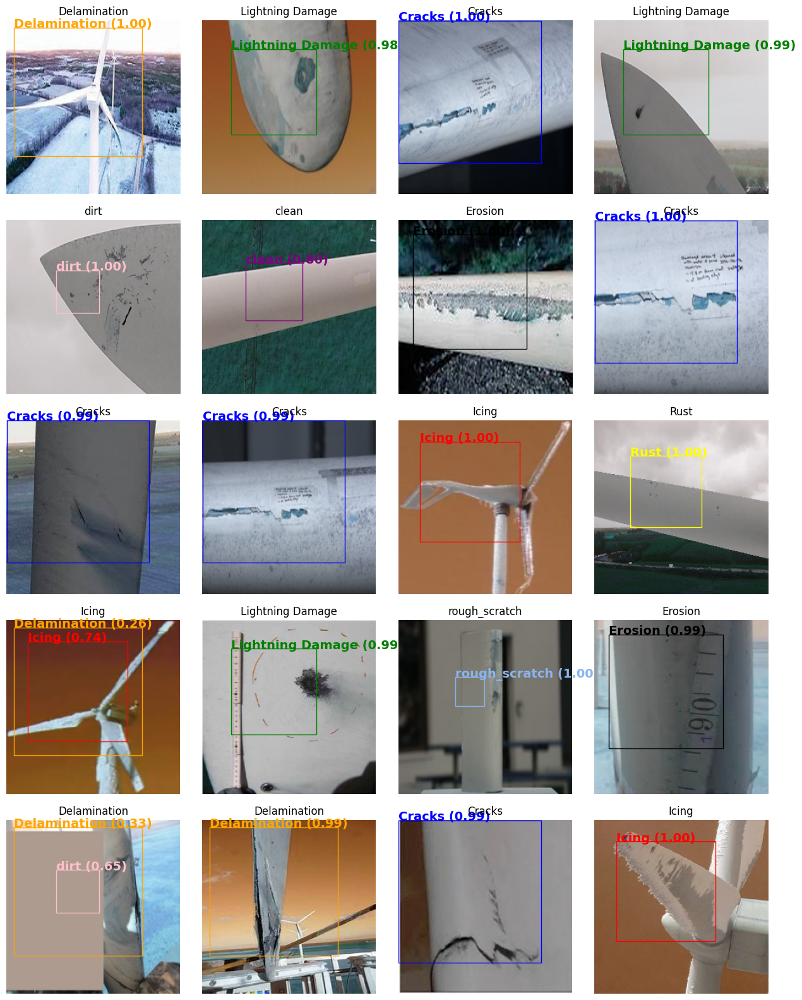

In [15]:
df2 = detect_faultsdf(Inception_ResNet_V2_model, imglist,labels,img_size)

In [16]:
df2

,Image,Ground Truth Label,Predicted Label,Confidence,Prediction Time (sec)
0,Sma15.jpg,Delamination,Delamination,1.00,8.04
1,2fac6.jpg,Lightning Damage,Lightning Damage,0.98,0.07
2,A0704.jpg,Cracks,Cracks,1.00,0.06
3,E7b18.jpg,Lightning Damage,Lightning Damage,0.99,0.06
4,Ce518.jpg,dirt,dirt,1.00,0.06
5,19ede.jpg,clean,clean,0.80,0.06
6,Aqh12.jpg,Erosion,Erosion,1.00,0.06
7,A0875.jpg,Cracks,Cracks,1.00,0.07
8,Msma3.jpg,Cracks,Cracks,0.99,0.07
9,A0724.jpg,Cracks,Cracks,0.99,0.06


### Other

In [9]:
def get_image_paths(image_path):
    if isinstance(image_path, list):
        image_pathss = image_path
    elif os.path.isdir(image_path):
        image_pathss = [os.path.join(root, file)
                       for root, dirs, files in os.walk(image_path)
                       for file in files
                       if file.endswith((".jpg", ".jpeg", ".png"))]
    else:
        image_pathss = [image_path]
    return image_pathss

In [15]:
import time

def detect_faultsdf(model, image_path, class_names, img_size=256, threshold=0.2):  
    """
    Detects faults in a wind turbine blade image using a trained CNN model.

    Args:
    - model: Trained Keras model object
    - image_path: File path of the input image or directory
    - class_names: List of class names (in order of model output)
    - img_size: Image size to resize to (default 256)
    - threshold: Prediction threshold (default 0.2)
    - n_cols: Number of columns in the final image grid (default 3)

    Returns:
    - df: Pandas dataframe with columns 'Image', 'Ground Truth Label', 'Predicted Label', 'Confidence'
    """  
    sepps = os.path.sep    
    
    image_paths = get_image_paths(image_path)
    n_cols = 3 if len(image_paths) < 7 else 4

    all_predictions = []
    predicted_images = []
    n_rows = int(np.ceil(len(image_paths) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
    axes = axes.flatten()
    

    colors = generate_colors(len(class_names))

    for i, path in enumerate(image_paths):
        image = cv2.imread(path)
        image = cv2.resize(image, (img_size, img_size))
        image = np.expand_dims(image, axis=0) / 255.

        start_time = time.time()
        predictions = model.predict(image)
        end_time = time.time()

        prediction_time = end_time - start_time
        prediction_time_in_sec = f"{prediction_time:.2f} sec"

        pred_labels = []
        confidences = []  

        ax = axes[i]
        ax.imshow(np.squeeze(image))

        for j, prediction in enumerate(predictions[0]):
            if prediction >= threshold:
                pred_labels.append(class_names[j])
                confidences.append(prediction)
                
                x1, y1, x2, y2 = (10 * j, 10 * j, 200 - 10 * j, 200 - 10 * j)
                colord = colors[j]
                rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                     fill=False, color=colord)
                ax.add_patch(rect)
                ax.text(x1, y1, f'{class_names[j]} ({prediction:.2f})',
                        fontsize=14, fontweight='bold', color=colord)
                
        gt_label = path.split(os.path.sep)[-2]
        pred_label = ','.join(pred_labels) if pred_labels else 'None'
        confidence = ','.join([f'{c:.2f}' for c in confidences]) if confidences else 'None'

        ax.set_title(path.split(sepps)[-2])
        ax.axis('off')

        predicted_images.append(fig)
        
        all_predictions.append((os.path.basename(path), gt_label, pred_label, confidence, prediction_time_in_sec))
            
    df = pd.DataFrame(all_predictions, columns=['Image', 'Ground Truth Label', 'Predicted Label', 'Confidence', 'Prediction Time'])

    for i in range(len(image_paths), n_rows * n_cols):
        fig.delaxes(axes[i])

    fig.subplots_adjust(wspace=0.005, hspace=0.15)  # modify the spacing between subplots
    plt.savefig('final_image.png', bbox_inches='tight', pad_inches=0)
    
    
    df_split = df.assign(Ground_Truth_Label=df['Ground Truth Label']).assign(Predicted_Label=df['Predicted Label'].str.split(',')).explode('Predicted_Label')
    count = len(df_split[df_split['Ground_Truth_Label'] == df_split['Predicted_Label']])
    countb = len(df_split[df_split['Ground_Truth_Label'] != df_split['Predicted_Label']])
    print(f"Total predictions that match each Ground Truth: {count}")
    print(f"Total predictions that do not match each Ground Truth: {countb}")
    
    # Save the DataFrame to the CSV file
    df.to_csv('SamplePredicted.csv', index=False)

    return df


In [16]:
def detect_faults_images(model, image_path, class_names, img_size=256, threshold=0.2):
    sepps = os.path.sep

    image_paths = get_image_paths(image_path)
    n_cols = min(4, len(image_paths))

    all_predictions = []
    data = []

    fig, axes = plt.subplots(len(image_paths), n_cols, figsize=(4 * n_cols, 4 * len(image_paths)))
    axes = axes.flatten()

    for i, path in enumerate(image_paths):
        image = cv2.imread(path)
        image = cv2.resize(image, (img_size, img_size))
        image = np.expand_dims(image, axis=0) / 255.

        predictions = model.predict(image)

        pred_labels = []
        confidences = []  
        colors = generate_colors(len(class_names))

        ax = axes[i*n_cols:(i+1)*n_cols]
        ax[0].imshow(np.squeeze(image))
        ax[0].set_title(path.split(sepps)[-2])
        ax[0].axis('off')

        for j, prediction in enumerate(predictions[0]):
            if prediction >= threshold:
                pred_labels.append(class_names[j])
                confidences.append(prediction)
                
                x1, y1, x2, y2 = (10 * j, 10 * j, 200 - 10 * j, 200 - 10 * j)
                colord = colors[j]
                rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                     fill=False, color=colord)
                ax[0].add_patch(rect)
                ax[0].text(x1, y1, f'{class_names[j]} ({prediction:.2f})',
                        fontsize=14, fontweight='bold', color=colord)

        gt_label = path.split(sepps)[-2]
        pred_label = ','.join(pred_labels) or 'None'
        confidence = ','.join(f'{c:.2f}' for c in confidences) or 'None'

        all_predictions.append((os.path.basename(path), gt_label, pred_label, confidence))

        for j, prediction in enumerate(predictions[0]):
            if prediction > threshold:
                ax[j].imshow(np.squeeze(image))
                ax[j].set_title(f'{class_names[j]} ({prediction:.2f})')
                ax[j].axis('off')

                predictions = [(class_names[j], x1, y1, x2, y2, prediction)
                               for j, prediction in enumerate(predictions[0])
                               if prediction > threshold]
                for prediction in predictions:
                    data.append([os.path.basename(path), gt_label, prediction[0], prediction[5]])

        for k in range(j+1, n_cols):
            ax[k].axis('off')

    df = pd.DataFrame(all_predictions, columns=['Image', 'Ground Truth Label', 'Predicted Label', 'Confidence'])

    fig.subplots_adjust(wspace=0.05, hspace=0.005)
    # plt.show()
    plt.savefig('final_image.png', bbox_inches='tight', pad_inches=0)

    df_split = df.assign(Predicted_Label=df['Predicted Label'].str.split(',')).explode('Predicted_Label')
    count = (df_split['Ground Truth Label'] == df_split['Predicted_Label']).sum()
    countb = (df_split['Ground Truth Label'] != df_split['Predicted_Label']).sum()
    print(f"Total predictions that match each Ground Truth: {count}")
    print(f"Total predictions that do not match each Ground Truth: {countb}")

    return df


In [29]:
seed = 165795
imglist =  random_sample(all_filesc, 20,seed) # random.sample(all_filesc, 20)
# imglist

1/1 [==============================] - 0s 30ms/step
Total predictions that match each Ground Truth: 20
Total predictions that do not match each Ground Truth: 2


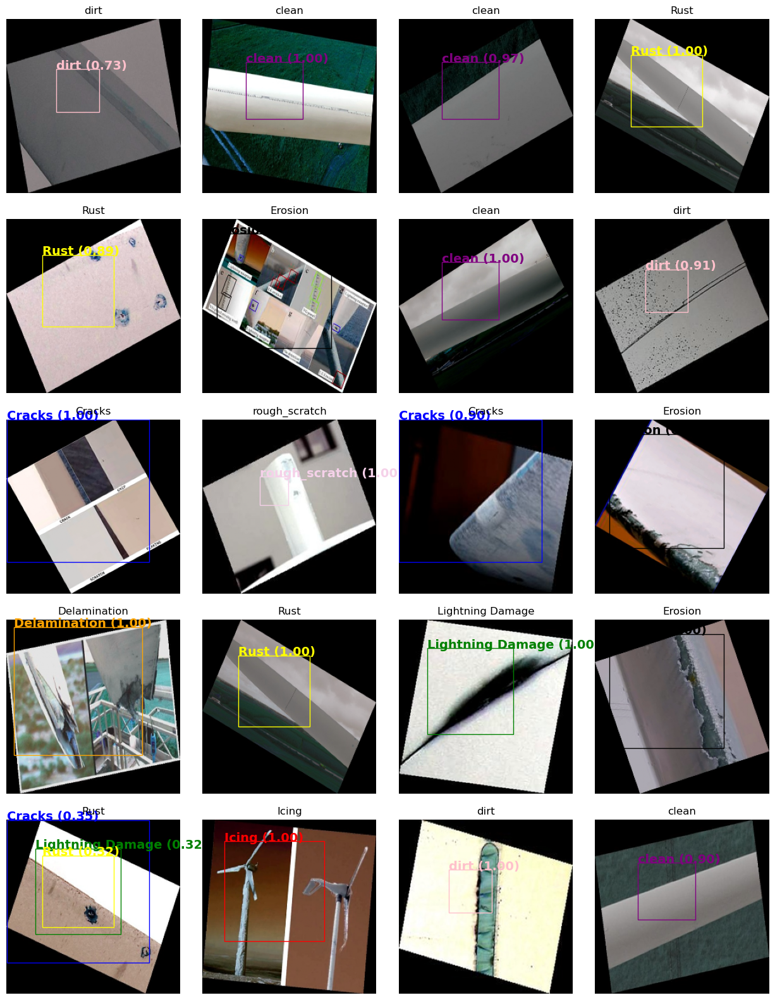

In [30]:
df2 = detect_faultsdf(Inception_ResNet_V2_model, imglist,labels,img_size)

In [31]:
df2

,Image,Ground Truth Label,Predicted Label,Confidence,Prediction Time
0,resized_synthetic_2854.jpg,dirt,dirt,0.73,0.16 sec
1,resized_synthetic_2323.jpg,clean,clean,1.00,0.12 sec
2,resized_synthetic_1785.jpg,clean,clean,0.97,0.06 sec
3,resized_synthetic_848.jpg,Rust,Rust,1.00,0.06 sec
4,resized_synthetic_577.jpg,Rust,Rust,0.89,0.06 sec
5,resized_synthetic_522.jpg,Erosion,Erosion,1.00,0.06 sec
6,resized_synthetic_759.jpg,clean,clean,1.00,0.06 sec
7,resized_synthetic_1427.jpg,dirt,dirt,0.91,0.06 sec
8,resized_synthetic_359.jpg,Cracks,Cracks,1.00,0.06 sec
9,resized_synthetic_1909.jpg,rough_scratch,rough_scratch,1.00,0.06 sec


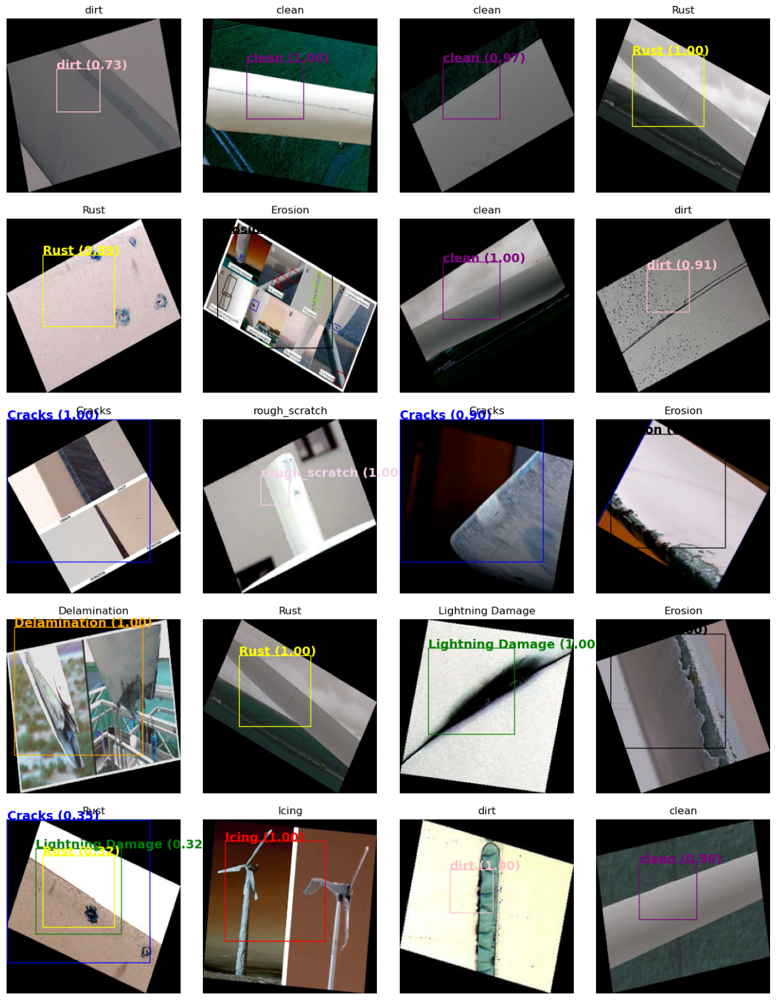

In [32]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the saved image
img = mpimg.imread('final_image.png')

# Show the image
plt.figure(figsize=(15, 20))
plt.imshow(img)
plt.axis('off')
plt.show()


# # Show the image using plt.imshow() and enlarge it
# plt.figure(figsize=(10, 10))
# plt.imshow(img)
# plt.axis('off')
# plt.show()

# Section C: Evaluation

In [1]:
import nbimporter
import import_ipynb

import ModelsListDiffFuntions
from ModelsListDiffFuntions import *

# List all the functions defined in the other notebook
print(dir(ModelsListDiffFuntions))

['AbstractRNNCell', 'Activation', 'ActivityRegularization', 'Adam', 'Add', 'AdditiveAttention', 'AlphaDropout', 'Attention', 'Average', 'AveragePooling1D', 'AveragePooling2D', 'AveragePooling3D', 'AvgPool1D', 'AvgPool2D', 'AvgPool3D', 'BatchNormalization', 'Bidirectional', 'CategoryEncoding', 'CenterCrop', 'Concatenate', 'ConfusionMatrixDisplay', 'Conv1D', 'Conv1DTranspose', 'Conv2D', 'Conv2DTranspose', 'Conv3D', 'Conv3DTranspose', 'ConvLSTM1D', 'ConvLSTM2D', 'ConvLSTM3D', 'Convolution1D', 'Convolution1DTranspose', 'Convolution2D', 'Convolution2DTranspose', 'Convolution3D', 'Convolution3DTranspose', 'Cropping1D', 'Cropping2D', 'Cropping3D', 'Dense', 'DenseFeatures', 'DepthwiseConv1D', 'DepthwiseConv2D', 'DetCurveDisplay', 'Discretization', 'DistanceMetric', 'Dot', 'Dropout', 'ELU', 'EarlyStopping', 'EinsumDense', 'Embedding', 'EvaluateTest', 'Flatten', 'FolderTree', 'GPUtil', 'GRU', 'GRUCell', 'GaussianDropout', 'GaussianNoise', 'GlobalAveragePooling1D', 'GlobalAveragePooling2D', 'Glob

## Main

In [2]:
# load the saved model
Custom_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_model_2023-03-06 2238.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_history_2023-03-06 2238.pkl', 'rb') as f:
    Custom_history = pickle.load(f)
    
# load the saved model
Inception_ResNet_V2_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-ResNet-V2_model_2023-03-06 1602.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-ResNet-V2_history_2023-03-06 1602.pkl', 'rb') as f:
    Inception_ResNet_V2_history = pickle.load(f)
    
# # load the saved model
# Inception_V2_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-V2_model_2023-03-06 0745.h5')
# # load the saved history
# with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-V2_history_2023-03-06 0745.pkl', 'rb') as f:
#     Inception_V2_history = pickle.load(f)

In [3]:
data_folder = check_folder = os.path.join('..', 'data', 'data4d')
check_folder = os.path.join('..', 'data', 'data4c','test')
print(len(check_folder))
# C:\Users\scrwh\Documents\PythonScripts\Master_Thesis\data\data4b\check

batch_size=32
epochs=50
img_size=244

# Retrieve input image size
img_size = Custom_model.layers[0].input_shape[1]

val_datagen = ImageDataGenerator(
    rescale=1./255
)
# test_generator = load_data_generator(val_datagen, data_folder, 'test')
test_generator = load_data_generator(val_datagen, data_folder, 'test', img_size = img_size, batch_size = batch_size)



num_classes = len(test_generator.class_indices)
# labels = train_generator.class_indices
labels = list(test_generator.class_indices.keys())

19
Found 2907 images belonging to 9 classes.


Found 2907 images belonging to 9 classes.
91/91 [==============================] - 17s 130ms/step - loss: 0.0969 - accuracy: 0.9684
EvaluateTime_report
      Time per image (s)
test            0.005982
Training indexes
                      first  lowest  highest    last
training loss        0.8005  0.0779   0.8005  0.0779
training accuracy    0.7368  0.7368   0.9731  0.9731
validation loss      0.4380  0.0688   0.4380  0.0701
validation accuracy  0.8600  0.8600   0.9771  0.9750 



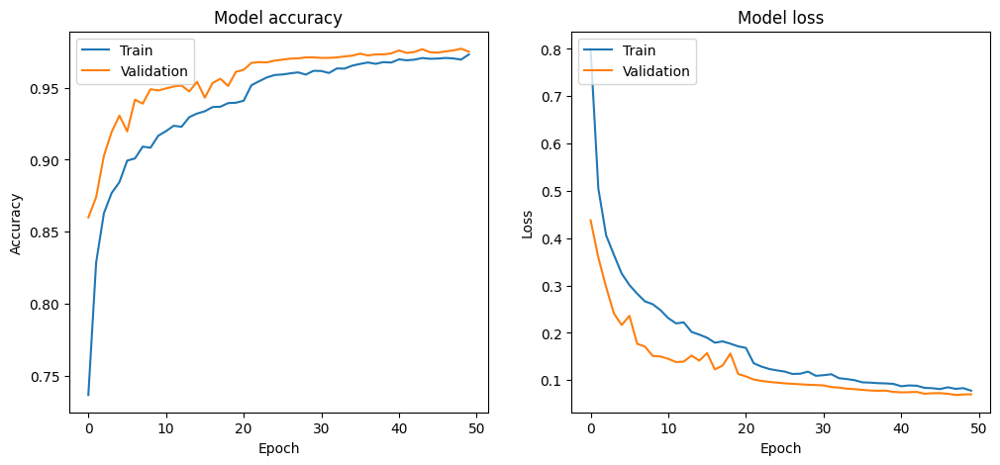

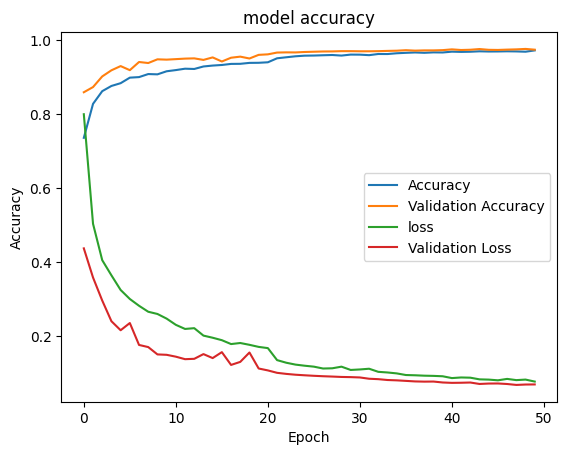


 Evaluate the model on the test set
Test loss: 0.0969206765294075
Test accuracy: 0.9683522582054138
91/91 [==============================] - 13s 123ms/step


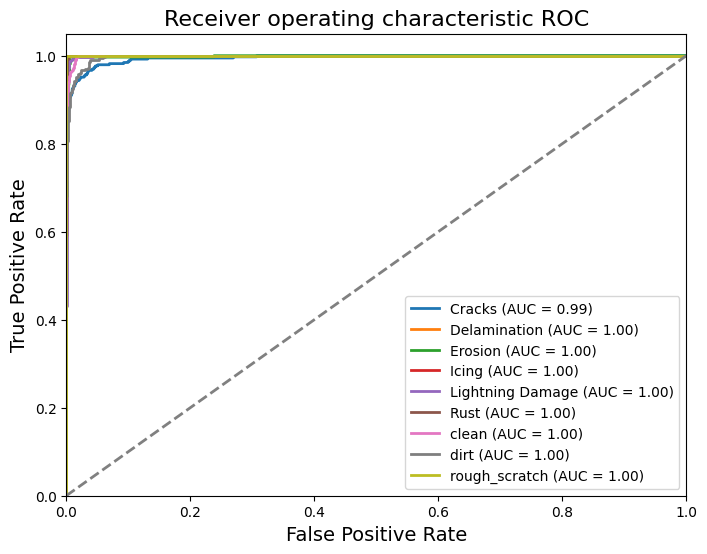

clases: 
 ['Cracks', 'Delamination', 'Erosion', 'Icing', 'Lightning Damage', 'Rust', 'clean', 'dirt', 'rough_scratch']
 
Confusion matrix:
 [[361   1  10   0   5   0   5   8   0]
 [  2 313   0   0   0   0   0   1   0]
 [ 10   2 305   0   0   0   0   1   0]
 [  0   0   0 304   0   0   0   0   0]
 [  3   0   0   0 308   1   0   1   0]
 [  1   0   0   0   2 299   1   0   0]
 [  2   1   0   0   1   0 304  10   0]
 [  7   1   2   1   5   1   7 308   0]
 [  0   0   0   0   0   0   0   0 313]]
                  Cracks  Delamination  Erosion  Icing  Lightning Damage  \
Cracks               361             1       10      0                 5   
Delamination           2           313        0      0                 0   
Erosion               10             2      305      0                 0   
Icing                  0             0        0    304                 0   
Lightning Damage       3             0        0      0               308   
Rust                   1             0        0     

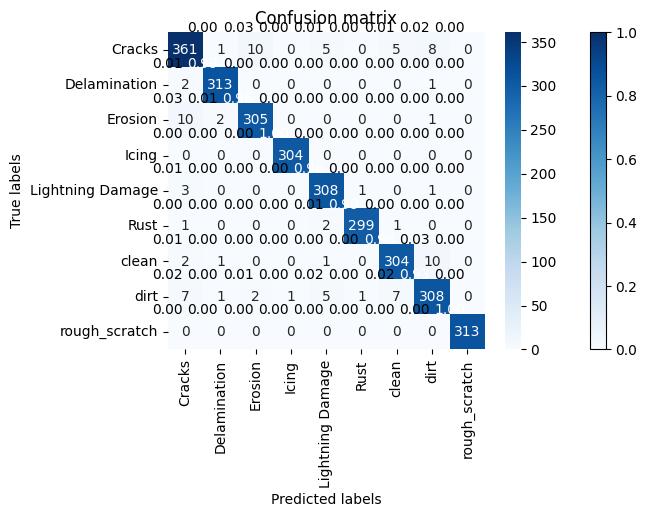

In [4]:
EvaluateTest(data_folder, Inception_ResNet_V2_model, Inception_ResNet_V2_history, batch_size=32, img_size=256)

## Others

In [195]:
# Data augmentation for test set
# Data augmentation and generators
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20,  width_shift_range=0.2,  height_shift_range=0.2,  shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest')

# Data augmentation for validation set
val_datagen = ImageDataGenerator(rescale=1./255)

# def load_data_generator(datagen, data_dir, subdir):
#     return datagen.flow_from_directory(
#         os.path.join(data_dir, subdir),
#         target_size=(img_size, img_size),
#         batch_size=batch_size,
#         class_mode='categorical',
#             Shuffle = False
#     )

# Load the training, validation and test set
train_generator = load_data_generator(train_datagen, data_folder, 'train')
val_generator = load_data_generator(val_datagen, data_folder, 'val')
test_generator = load_data_generator(val_datagen, data_folder, 'test')

# preds = Inception_V2_model.predict(test_generator)
# preds_cls_idx = preds.argmax(axis=-1)

# import numpy as np

# idx_to_cls = {v: k for k, v in train_generator.class_indices.items()}
# preds_cls = np.vectorize(idx_to_cls.get)(preds_cls_idx)
# filenames_to_cls = list(zip(test_generator.filenames, preds_cls))


# print(filenames_to_cls)

test_generator.reset()
prediction = Inception_V2_model.predict(test_generator,verbose=1,steps=len(test_generator))
predicted_class = np.argmax(prediction,axis=1)

l = dict((v,k) for k,v in test_generator.class_indices.items())
prednames = [l[k] for k in predicted_class]

filenames = test_generator.filenames
# Extract the second-to-last element of each filename
FileClass = [filename.split(os.path.sep)[-2] for filename in filenames]

finaldf = pd.DataFrame({'Filename': filenames,'FileClass': FileClass,'Prediction': prednames})

df_split = finaldf.assign(Ground_Truth_Label=finaldf['FileClass']).assign(Predicted_Label=finaldf['Prediction'].str.split(',')).explode('Prediction')

count = len(df_split[df_split['Ground_Truth_Label'] == df_split['Predicted_Label']])
countb = len(df_split[df_split['Ground_Truth_Label'] != df_split['Predicted_Label']])
print(f"Total predictions that match each Ground Truth: {count}")
print(f"Total predictions that do not match each Ground Truth: {countb}")

finaldf
# prediction
# filenames.split(os.path.sep)[-2]

Found 20301 images belonging to 9 classes.
Found 5798 images belonging to 9 classes.
Found 2907 images belonging to 9 classes.
91/91 [==============================] - 6s 54ms/step
Total predictions that match each Ground Truth: 0
Total predictions that do not match each Ground Truth: 2907


,Filename,FileClass,Prediction
0,Cracks\resized_0007f771-6188-491d-907d-8fa9659...,Cracks,Lightning Damage
1,Cracks\resized_084664b3-7f27-4bc5-ba23-5aab6c2...,Cracks,rough_scratch
2,Cracks\resized_282282e3-8c87-4849-a869-bab43e2...,Cracks,Cracks
3,Cracks\resized_2C8A0695.jpg,Cracks,dirt
4,Cracks\resized_2C8A0697.jpg,Cracks,rough_scratch
...,...,...,...
2902,rough_scratch\resized_synthetic_924.jpg,rough_scratch,rough_scratch
2903,rough_scratch\resized_synthetic_942.jpg,rough_scratch,Erosion
2904,rough_scratch\resized_synthetic_966.jpg,rough_scratch,Erosion
2905,rough_scratch\resized_synthetic_969.jpg,rough_scratch,Erosion


# Section D: Visualizing the Model

## A

In [2]:
import nbimporter
import import_ipynb

import ModelsListDiffFuntions
from ModelsListDiffFuntions import *

# List all the functions defined in the other notebook
print(dir(ModelsListDiffFuntions))

['Activation', 'Adam', 'BatchNormalization', 'Conv2D', 'Dense', 'Dropout', 'EarlyStopping', 'EvaluateTest', 'Flatten', 'FolderTree', 'GPUtil', 'GlobalAveragePooling2D', 'Image', 'ImageDataGenerator', 'ImageFont', 'InceptionResNetV2', 'InceptionV3', 'Input', 'K', 'LabelBinarizer', 'LeakyReLU', 'LearningRateScheduler', 'List', 'MaxPooling2D', 'Model', 'ModelCheckpoint', 'Path', 'RMSprop', 'ReduceLROnPlateau', 'ResNet101', 'ResNet50', 'SGD', 'Sequential', 'Tuple', 'UpSampling2D', 'VGG16', '__builtins__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'auc', 'average_precision_score', 'block_2ConvPool', 'block_Res', 'block_Unconv', 'calculate_batch_size_steps_per_epoch_and_epochs', 'calculate_batch_size_steps_per_epoch_and_epochsb', 'calculate_steps_per_epoch_and_epochs', 'checkHistory', 'classification_report', 'cm', 'colorsys', 'combinations', 'concatenate', 'confusion_matrix', 'custom_model', 'custom_modelB', 'cv2', 'datetime', 'detect_faults', 'detect_fault

In [4]:
# load the saved model
Custom_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_model_2023-03-06 2238.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_history_2023-03-06 2238.pkl', 'rb') as f:
    Custom_history = pickle.load(f)
    
# load the saved model
Inception_ResNet_V2_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-ResNet-V2_model_2023-03-06 1602.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-ResNet-V2_history_2023-03-06 1602.pkl', 'rb') as f:
    Inception_ResNet_V2_history = pickle.load(f)
    
# load the saved model
Inception_V2_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-V2_model_2023-03-06 0745.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-V2_history_2023-03-06 0745.pkl', 'rb') as f:
    Inception_V2_history = pickle.load(f)

## Custom_model

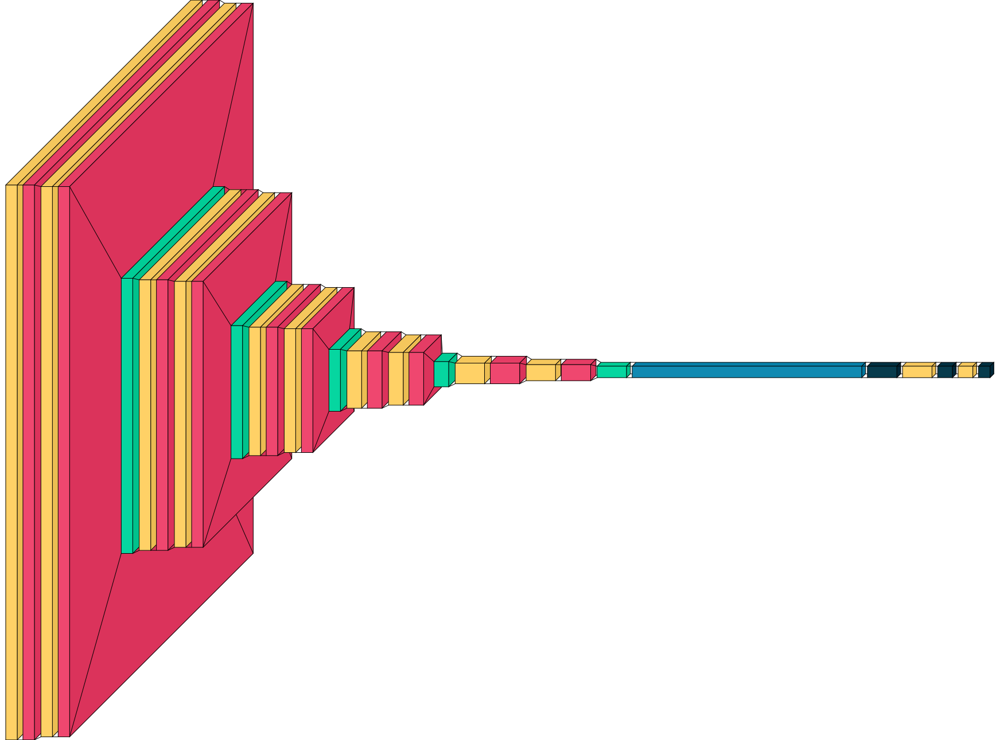

In [5]:
import visualkeras
visualkeras.layered_view(Custom_model)

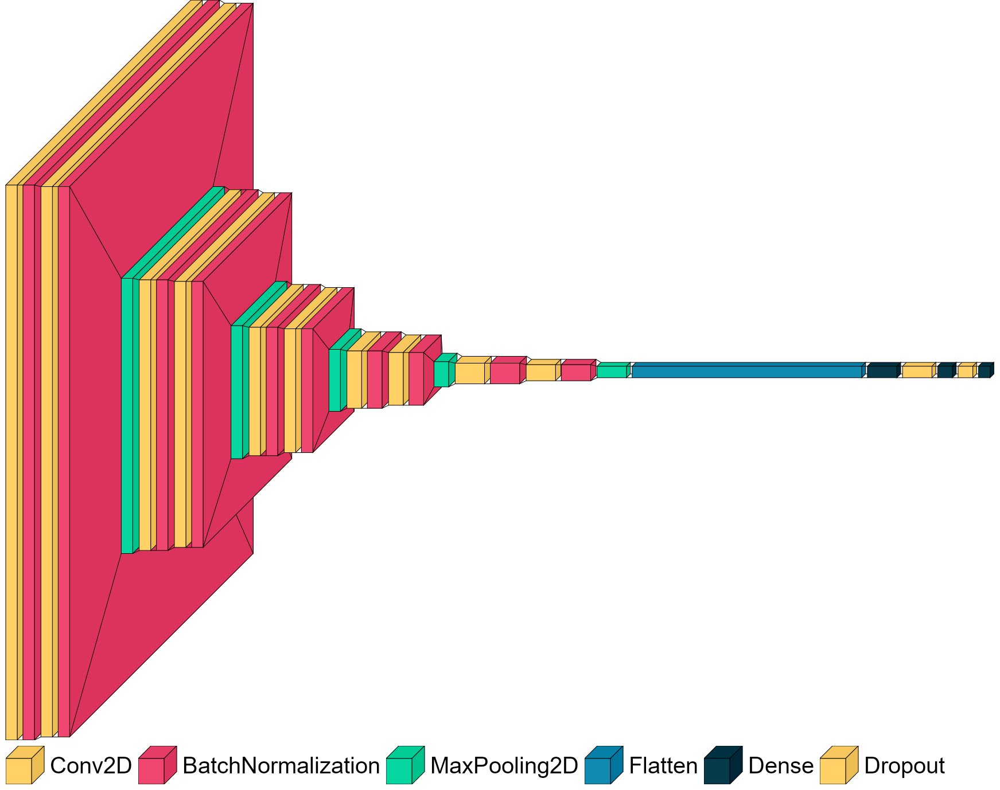

In [24]:
from PIL import ImageFont

font = ImageFont.truetype("arial.ttf",320)  # using comic sans is strictly prohibited!
visualkeras.layered_view(Custom_model, legend=True, font=font, to_file="Custom_model.png")  # font is optional!

In [23]:
from PIL import ImageFont

font = ImageFont.truetype("arial.ttf", 300)  # using comic sans is strictly prohibited!
visualkeras.layered_view(Inception_ResNet_V2_model, legend=True, font=font, to_file="Inception_ResNet_V2_model.png")  # font is optional!

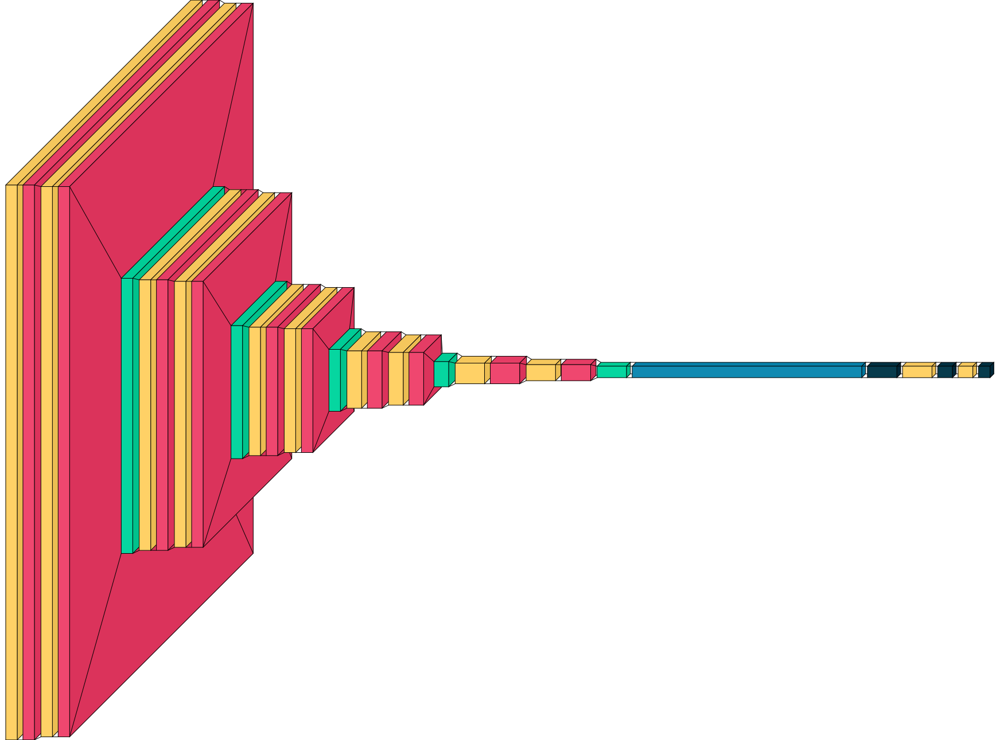

In [5]:
from tensorflow.python.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D, ZeroPadding2D
from collections import defaultdict

color_map = defaultdict(dict)
color_map[Conv2D]['fill'] = 'orange'
color_map[ZeroPadding2D]['fill'] = 'gray'
color_map[Dropout]['fill'] = 'pink'
color_map[MaxPooling2D]['fill'] = 'red'
color_map[Dense]['fill'] = 'green'
color_map[Flatten]['fill'] = 'teal'

visualkeras.layered_view(Custom_model, color_map=color_map)

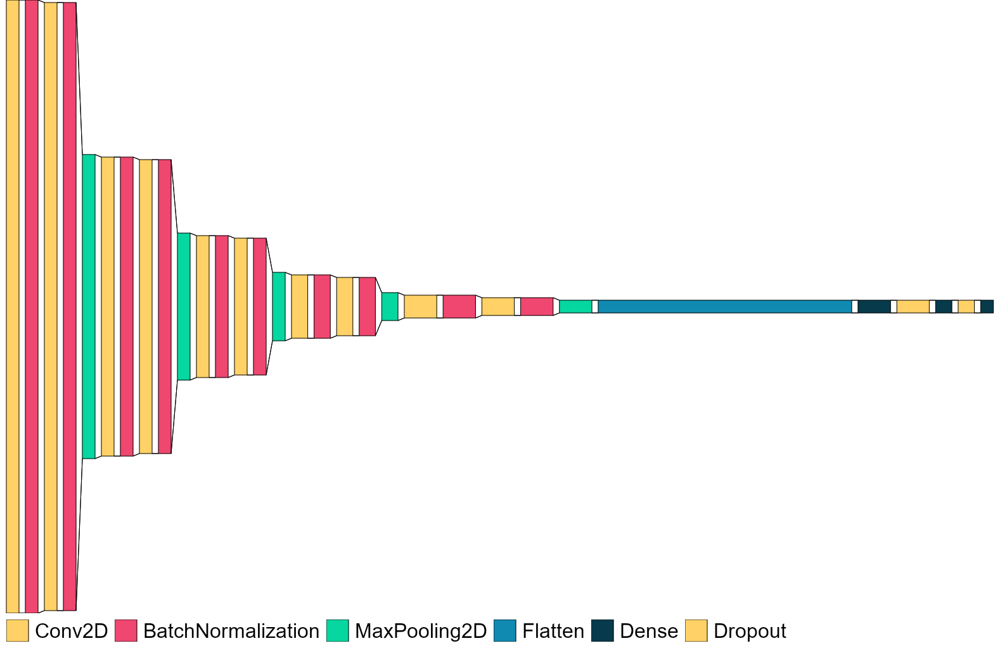

In [6]:
visualkeras.layered_view(Custom_model, legend=True, font=font, draw_volume=False)

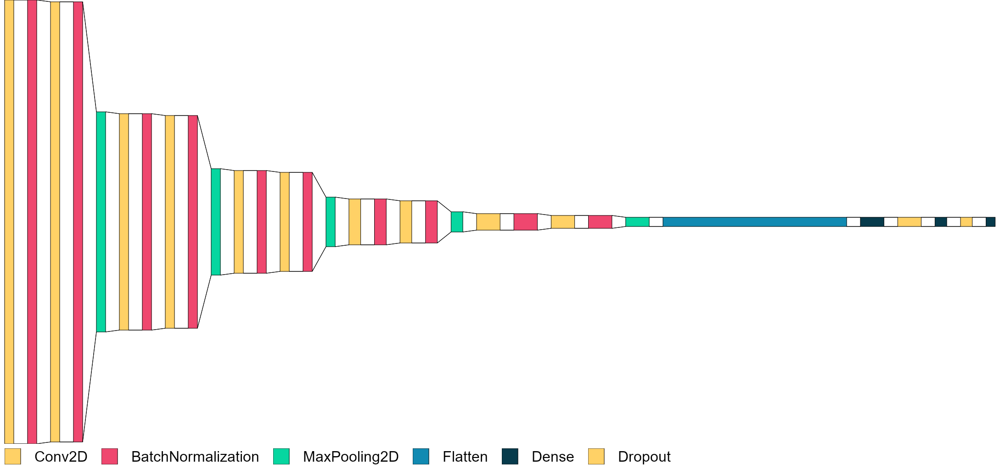

In [7]:
visualkeras.layered_view(Custom_model, legend=True, font=font, draw_volume=False,spacing=30)

In [25]:
plot_model(Inception_ResNet_V2_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

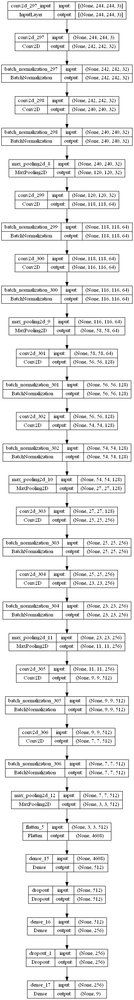

In [9]:
keras.utils.plot_model(Custom_model, "multi_input_and_output_model.png", show_shapes=True)

In [10]:
keras2ascii(Custom_model)

           OPERATION           DATA DIMENSIONS   WEIGHTS(N)   WEIGHTS(%)

               Input   #####    244  244    3
              Conv2D    \|/  -------------------       896     0.0%
                relu   #####    242  242   32
  BatchNormalization    μ|σ  -------------------       128     0.0%
                       #####    242  242   32
              Conv2D    \|/  -------------------      9248     0.1%
                relu   #####    240  240   32
  BatchNormalization    μ|σ  -------------------       128     0.0%
                       #####    240  240   32
        MaxPooling2D   Y max -------------------         0     0.0%
                       #####    120  120   32
              Conv2D    \|/  -------------------     18496     0.3%
                relu   #####    118  118   64
  BatchNormalization    μ|σ  -------------------       256     0.0%
                       #####    118  118   64
              Conv2D    \|/  -------------------     36928     0.5%
              

In [2]:
from quiver_engine import server

# server.launch(model)

ImportError: cannot import name 'imsave' from 'scipy.misc' (C:\anaconda3\lib\site-packages\scipy\misc\__init__.py)


This will launch the visualization at localhost:5000

Options

```python
server.launch(
        model, # a Keras Model

        classes, # list of output classes from the model to present (if not specified 1000 ImageNet classes will be used)

        top, # number of top predictions to show in the gui (default 5)

        # where to store temporary files generatedby quiver (e.g. image files of layers)
        temp_folder='./tmp',

        # a folder where input images are stored
        input_folder='./',

        # the localhost port the dashboard is to be served on
        port=5000,
        # custom data mean
        mean=[123.568, 124.89, 111.56],
        # custom data standard deviation
        std=[52.85, 48.65, 51.56]
    )
    
```
Example
```python
# 1 Build your model in keras
model = Model(...)
# 2 Launch the visualization dashboard with 1 line of code
quiver_engine.server.launch(model, classes=['cat','dog'], input_folder='./imgs')
# Explore layer activations on all the different images in your input folder.
```


## C

In [ ]:
# Tensorbord Setup
# Load the TensorBoard notebook extension.
%load_ext tensorboard


In [11]:
from datetime import datetime
from packaging import version

import tensorflow as tf
from tensorflow import keras

print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >= 2, \
    "This notebook requires TensorFlow 2.0 or above."


TensorFlow version:  2.10.1


In [12]:
import tensorboard
tensorboard.__version__


'2.10.1'

In [ ]:
# Clear any logs from previous runs
rm -rf ./logs/


In [ ]:
# Define the Keras TensorBoard callback.
logdir="logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

# Train the model.
model.fit(
    train_images,
    train_labels, 
    batch_size=64,
    epochs=5, 
    callbacks=[tensorboard_callback])


In [ ]:
%tensorboard --logdir logs


In [ ]:
!tensorboard dev upload \
  --logdir logs \
  --name "Sample op-level graph" \
  --one_shot


In [ ]:
from keras_sequential_ascii import keras2ascii
keras2ascii(model)

In [ ]:
import torchvision.models as models

model = models.resnet18()

plot_model_architecture(model)

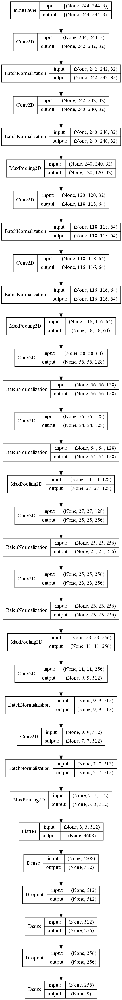

In [4]:
from keras.utils.vis_utils import plot_model
plot_model(Custom_model, to_file='model.png', show_shapes=True, show_layer_names=False)

# Section E: Data Metrics

In [1]:
import nbimporter
import import_ipynb

import ModelsListDiffFuntions
from ModelsListDiffFuntions import *

# List all the functions defined in the other notebook
print(dir(ModelsListDiffFuntions))

['Activation', 'Adam', 'BatchNormalization', 'Conv2D', 'Dense', 'Dropout', 'EarlyStopping', 'EvaluateTest', 'Flatten', 'FolderTree', 'GPUtil', 'GlobalAveragePooling2D', 'ImageDataGenerator', 'ImageFont', 'InceptionResNetV2', 'InceptionV3', 'Input', 'K', 'LabelBinarizer', 'LeakyReLU', 'LearningRateScheduler', 'List', 'MaxPooling2D', 'Model', 'ModelCheckpoint', 'Path', 'RMSprop', 'ReduceLROnPlateau', 'ResNet101', 'ResNet50', 'SGD', 'Sequential', 'Tuple', 'UpSampling2D', 'VGG16', '__builtins__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'auc', 'average_precision_score', 'calculate_batch_size_steps_per_epoch_and_epochs', 'calculate_batch_size_steps_per_epoch_and_epochsb', 'calculate_steps_per_epoch_and_epochs', 'checkHistory', 'classification_report', 'colorsys', 'concatenate', 'confusion_matrix', 'custom_model', 'custom_modelB', 'cv2', 'datetime', 'detect_faults', 'detect_faults1', 'detect_faults2', 'detect_faults3', 'detect_faults4', 'detect_faults_image

In [2]:
# load the saved model
Custom_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_model_2023-03-06 2238.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_history_2023-03-06 2238.pkl', 'rb') as f:
    Custom_history = pickle.load(f)
    
# load the saved model
Inception_ResNet_V2_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-ResNet-V2_model_2023-03-06 1602.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-ResNet-V2_history_2023-03-06 1602.pkl', 'rb') as f:
    Inception_ResNet_V2_history = pickle.load(f)
    
# load the saved model
Inception_V2_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-V2_model_2023-03-06 0745.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-V2_history_2023-03-06 0745.pkl', 'rb') as f:
    Inception_V2_history = pickle.load(f)

In [6]:
data_folder = check_folder = os.path.join('..', 'data', 'data4d')
check_folder = os.path.join('..', 'data', 'data4c','test')
print(len(check_folder))
# C:\Users\scrwh\Documents\PythonScripts\Master_Thesis\data\data4b\check

batch_size=32
epochs=50
img_size=244

# Retrieve input image size
# img_size = Inception_ResNet_V2_model.layers[0].input_shape[1]

val_datagen = ImageDataGenerator(rescale=1./255)
# # test_generator = load_data_generator(val_datagen, data_folder, 'test')
test_generator = load_data_generatorb(val_datagen, data_folder, 'test', img_size = img_size, batch_size = batch_size)
# 


num_classes = len(test_generator.class_indices)
# labels = train_generator.class_indices
labels = list(test_generator.class_indices.keys())

19
Found 2907 images belonging to 9 classes.


In [4]:


# # Data augmentation for test set
# test_datagen = ImageDataGenerator(rescale=1./255)

# def load_data_generator(datagen, data_dir, subdir):
#     return datagen.flow_from_directory(
#         os.path.join(data_dir, subdir),
#         target_size=(img_size, img_size),
#         batch_size=batch_size,
#         class_mode='categorical'
#     )
# test_generator = load_data_generator(test_datagen, data_dir, 'test')

test_generator.reset()
# X_train, y_train = next(train_generator)
# X_val, y_val = next(validation_generator)
X_test, y_test = next(test_generator)
y_proba = Inception_ResNet_V2_model.predict(X_test, steps=len(test_generator), verbose=1)


# Get the true labels and the predicted labels from the test set
true_labels = test_generator.classes
predicted_labels = Inception_ResNet_V2_model.predict(test_generator, steps=len(test_generator), verbose=1)

91/91 [==============================] - 6s 58ms/step


In [5]:
print(X_test.shape,y_test.shape)

(32, 244, 244, 3) (32, 9)


In [6]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# train_dir = 'path/to/train/dir'
# batch_size = 32

# train_datagen = ImageDataGenerator(rescale=1./255)
# test_generator = train_datagen.flow_from_directory(
#         train_dir,
#         target_size=(224, 224),
#         batch_size=batch_size,
#         class_mode='binary')


val_datagen = ImageDataGenerator(rescale=1./255)
# # test_generator = load_data_generator(val_datagen, data_folder, 'test')
test_generator = load_data_generatorb(val_datagen, data_folder, 'test', img_size = img_size, batch_size = batch_size)
# 

# extract x_train and y_train
num_samples = len(test_generator)
x_test, y_test = next(test_generator)
for i in range(1, num_samples):
    batch_x, batch_y = next(test_generator)
    x_test = np.concatenate((x_test, batch_x))
    y_test = np.concatenate((y_test, batch_y))
print(x_test.shape, y_test.shape)


Found 2907 images belonging to 9 classes.
(2907, 244, 244, 3) (2907, 9)


In [7]:

batch_size=16
epochs=50
# img_size=244


# Retrieve input image size
img_size = Inception_ResNet_V2_model.layers[0].input_shape[1]

test_generator = load_data_generatorb(val_datagen, data_folder, 'test', img_size = img_size, batch_size = batch_size)

import tqdm
test_generator.reset()
x_test, y_test = next(test_generator)
for i in tqdm.tqdm(range(int(test_generator.n/batch_size)-1)): 
    img, label = next(test_generator)
    x_test = np.append(x_test, img, axis=0 )
    y_test = np.append(y_test, label, axis=0)
print(x_test.shape, y_test.shape)


Found 2907 images belonging to 9 classes.


100%|██████████| 180/180 [00:45<00:00,  3.94it/s]

(2896, 244, 244, 3) (2896, 9)


In [9]:
device_name = "/CPU:0"
device_name = "/CPU:0"
# Get the true labels and the predicted labels from the test set
true_labels = test_generator.classes
with tf.device(device_name):
    y_pred = Inception_ResNet_V2_model.predict(x_test, steps=len(x_test), verbose=1)
y_pred.shape

2896/2896 [==============================] - 103s 36ms/step


(2896, 9)

In [10]:
y_pred.argmax(axis=-1)
y_pred.shape

(2896, 9)

In [11]:
y_pred[0],y_test[0]

(array([4.0938568e-05, 4.8426788e-08, 1.2580927e-07, 4.7457462e-11,
        2.5540638e-07, 2.4641938e-07, 9.9962187e-01, 3.3647334e-04,
        2.3527476e-09], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 1., 0., 0.], dtype=float32))

In [12]:
device_name = "/CPU:0"
device_name = "/CPU:0"
# test_generator = x_test
# predicted_labels = y_pred,y_proba

# Get the true labels and the predicted labels from the test set
true_labels = test_generator.classes
with tf.device(device_name):
    predicted_labels = Inception_ResNet_V2_model.predict(test_generator, steps=len(test_generator), verbose=1)

182/182 [==============================] - 45s 248ms/step


In [14]:
predicted_labels.shape

(2907, 9)

In [7]:
data_folder = check_folder = os.path.join('..', 'data', 'data4d')
check_folder = os.path.join('..', 'data', 'data4c','test')
val_datagen = ImageDataGenerator(rescale=1./255)
# # test_generator = load_data_generator(val_datagen, data_folder, 'test')
test_generator = load_data_generatorb(val_datagen, data_folder, 'test', img_size = img_size, batch_size = batch_size)

Found 2907 images belonging to 9 classes.


In [8]:
true_labels = test_generator.classes
predicted_prob = Inception_ResNet_V2_model.predict(test_generator, steps=len(test_generator), verbose=1)
predicted_labels = np.argmax(predicted_prob, axis=1)
df = pd.DataFrame({'True Label': true_labels, 'Predicted Label': predicted_labels, 'Probability': np.max(predicted_prob, axis=1)})


91/91 [==============================] - 19s 117ms/step


In [9]:
df

,True Label,Predicted Label,Probability
0,0,7,0.999863
1,0,5,0.999890
2,0,0,0.999452
3,0,0,0.970787
4,0,3,1.000000
...,...,...,...
2902,8,0,0.913819
2903,8,6,0.999997
2904,8,0,0.991804
2905,8,3,1.000000


In [10]:
# get the true labels
y_true = test_generator.classes

# get the predicted labels and probabilities
predicted_prob = Inception_ResNet_V2_model.predict(test_generator, steps=len(test_generator), verbose=1)
y_pred = predicted_prob.argmax(axis=1)
prob = predicted_prob.max(axis=1)

# create a DataFrame with the results
results_df = pd.DataFrame({'true_label': y_true, 'predicted_label': y_pred, 'probability': prob})
results_df

91/91 [==============================] - 11s 116ms/step


,true_label,predicted_label,probability
0,0,2,0.995727
1,0,4,0.998343
2,0,2,0.990619
3,0,5,0.999995
4,0,4,0.999987
...,...,...,...
2902,8,1,0.999057
2903,8,0,0.999713
2904,8,7,1.000000
2905,8,7,1.000000


In [11]:
# get the true labels
y_true = test_generator.classes

# get the predicted labels and probabilities
predicted_prob = Inception_ResNet_V2_model.predict(test_generator, steps=len(test_generator), verbose=1)
y_pred = predicted_prob.argmax(axis=1)
prob = predicted_prob.max(axis=1)

# create a DataFrame with the results
results_df = pd.DataFrame({'true_label': y_true, 'predicted_label': y_pred, 'probability': prob})

# add the class labels to the DataFrame
class_labels = list(test_generator.class_indices.keys())
results_df['true_class'] = results_df['true_label'].apply(lambda x: class_labels[x])
results_df['predicted_class'] = results_df['predicted_label'].apply(lambda x: class_labels[x])
results_df

91/91 [==============================] - 11s 116ms/step


,true_label,predicted_label,probability,true_class,predicted_class
0,0,6,0.987943,Cracks,clean
1,0,0,0.949029,Cracks,Cracks
2,0,7,0.999984,Cracks,dirt
3,0,1,0.886764,Cracks,Delamination
4,0,7,0.999614,Cracks,dirt
...,...,...,...,...,...
2902,8,6,0.993668,rough_scratch,clean
2903,8,5,1.000000,rough_scratch,Rust
2904,8,5,0.999877,rough_scratch,Rust
2905,8,3,1.000000,rough_scratch,Icing


In [12]:
from sklearn.metrics import multilabel_confusion_matrix

# get the confusion matrix
cm = multilabel_confusion_matrix(y_true, y_pred)

# calculate the tpr and fpr for each class
tpr = []
fpr = []
for i in range(len(class_labels)):
    tn, fp, fn, tp = cm[i].ravel()
    tpr_i = tp / (tp + fn)
    fpr_i = fp / (fp + tn)
    tpr.append(tpr_i)
    fpr.append(fpr_i)
    
# create a DataFrame with the tpr and fpr for each class
tpr_fpr_df = pd.DataFrame({'class': class_labels, 'tpr': tpr, 'fpr': fpr})
tpr_fpr_df

,class,tpr,fpr
0,Cracks,0.135897,0.128725
1,Delamination,0.098101,0.111154
2,Erosion,0.135220,0.106219
3,Icing,0.121711,0.102574
4,Lightning Damage,0.150160,0.106399
5,Rust,0.125413,0.102151
6,clean,0.113208,0.113944
7,dirt,0.111446,0.109126
8,rough_scratch,0.099042,0.108712


In [13]:
# get the true labels
y_true = test_generator.classes

# get the predicted labels and probabilities
predicted_prob = Inception_ResNet_V2_model.predict(test_generator, steps=len(test_generator), verbose=1)
y_pred = predicted_prob.argmax(axis=1)
prob = predicted_prob.max(axis=1)

# create a DataFrame with the results
results_df = pd.DataFrame({'true_label': y_true, 'predicted_label': y_pred, 'probability': prob})

# add the class labels to the DataFrame
class_labels = list(test_generator.class_indices.keys())
results_df['true_class'] = results_df['true_label'].apply(lambda x: class_labels[x])
results_df['predicted_class'] = results_df['predicted_label'].apply(lambda x: class_labels[x])
results_df

91/91 [==============================] - 11s 116ms/step


,true_label,predicted_label,probability,true_class,predicted_class
0,0,8,0.999994,Cracks,rough_scratch
1,0,7,0.616228,Cracks,dirt
2,0,5,0.999911,Cracks,Rust
3,0,7,0.998368,Cracks,dirt
4,0,7,0.885306,Cracks,dirt
...,...,...,...,...,...
2902,8,1,1.000000,rough_scratch,Delamination
2903,8,4,0.983620,rough_scratch,Lightning Damage
2904,8,8,0.999919,rough_scratch,rough_scratch
2905,8,6,0.999414,rough_scratch,clean


In [14]:
from sklearn.metrics import confusion_matrix

# get the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# calculate the tpr and fpr for each class
tpr = []
fpr = []
for i in range(len(class_labels)):
    tn = np.sum(cm) - np.sum(cm[i,:]) - np.sum(cm[:,i]) + cm[i,i]
    fp = np.sum(cm[:,i]) - cm[i,i]
    fn = np.sum(cm[i,:]) - cm[i,i]
    tp = cm[i,i]
    tpr_i = tp / (tp + fn)
    fpr_i = fp / (fp + tn)
    tpr.append(tpr_i)
    fpr.append(fpr_i)

# create a DataFrame with the tpr and fpr for each class
tpr_fpr_df = pd.DataFrame({'class': class_labels, 'tpr': tpr, 'fpr': fpr})
tpr_fpr_df

,class,tpr,fpr
0,Cracks,0.105128,0.133492
1,Delamination,0.101266,0.110768
2,Erosion,0.125786,0.107377
3,Icing,0.098684,0.105263
4,Lightning Damage,0.108626,0.111411
5,Rust,0.102310,0.104839
6,clean,0.116352,0.113557
7,dirt,0.087349,0.112233
8,rough_scratch,0.083067,0.110640


In [30]:
import numpy as np
import pandas as pd

# Get true labels
true_labels = test_generator.classes

device_name = "/CPU:0"
with tf.device(device_name):
    # Get predicted labels and probabilities
    predicted_prob = Custom_model.predict(test_generator, steps=len(test_generator), verbose=1)
    predicted_labels = np.argmax(predicted_prob, axis=1)
    probabilities = np.max(predicted_prob, axis=1)

# Create dataframe
df = pd.DataFrame({'true_label': true_labels, 'predicted_label': predicted_labels, 'probability': probabilities})

df


91/91 [==============================] - 43s 466ms/step


,true_label,predicted_label,probability
0,0,1,1.000000
1,0,8,1.000000
2,0,5,0.999404
3,0,5,0.999999
4,0,3,1.000000
...,...,...,...
2902,8,8,1.000000
2903,8,0,0.999920
2904,8,3,1.000000
2905,8,5,1.000000


In [ ]:
# Calculate TPR and FPR
from sklearn.metrics import confusion_matrix

tn, fp, fn, tp = confusion_matrix(df['true_label'], df['predicted_label']).ravel()
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)

In [22]:
predicted_prob, y_true

(array([[5.1702980e-08, 1.7064646e-07, 5.9622812e-06, ..., 1.5785410e-10,
         2.1073789e-11, 9.9999380e-01],
        [1.4886734e-01, 3.3961624e-05, 7.7356664e-05, ..., 4.5750225e-03,
         6.1622787e-01, 4.1648582e-06],
        [6.8350171e-05, 3.0691530e-07, 1.2089381e-10, ..., 4.0817176e-07,
         1.9792230e-06, 6.4157131e-11],
        ...,
        [6.8828813e-05, 3.6223207e-06, 3.8885109e-06, ..., 1.5380144e-06,
         2.4601109e-06, 9.9991894e-01],
        [2.9502547e-04, 4.9834762e-05, 9.7323953e-09, ..., 9.9941432e-01,
         2.3899731e-04, 3.1412855e-11],
        [9.1951879e-05, 2.7655642e-10, 9.9990809e-01, ..., 9.2591726e-14,
         9.0425806e-10, 7.7741819e-10]], dtype=float32),
 array([0, 0, 0, ..., 8, 8, 8]))

In [42]:
import pandas as pd
import numpy as np

# # Get true labels
# true_labels = test_generator.labels
# # Get true labels
# y_true = test_generator.classes

# Get true labels
true_labels = test_generator.classes



device_name = "/CPU:0"
with tf.device(device_name):
    # Get predicted probabilities for all classes
    predicted_prob = Inception_ResNet_V2_model.predict(test_generator, steps=len(test_generator), verbose=1)

    
# Get predicted labels (class with highest probability)
predicted_labels = np.argmax(predicted_prob, axis=1)

# Create a DataFrame with true label, predicted label, and predicted probability for each sample
df = pd.DataFrame({'true_label': true_labels, 'predicted_label': predicted_labels})
for i in range(9):
    df['prob_class_'+str(i)] = predicted_prob[:,i]




df

91/91 [==============================] - 121s 1s/step


,true_label,predicted_label,prob_class_0,prob_class_1,prob_class_2,prob_class_3,prob_class_4,prob_class_5,prob_class_6,prob_class_7,prob_class_8
0,0,0,9.989824e-01,4.724488e-12,1.737323e-08,4.243948e-19,1.017460e-03,2.059338e-10,6.676188e-10,6.545668e-08,1.640628e-12
1,0,1,5.160328e-06,9.999405e-01,6.718758e-07,1.220807e-08,4.998653e-08,1.788959e-12,1.469524e-05,3.887944e-05,1.608591e-08
2,0,3,3.413999e-07,2.491437e-09,3.834098e-12,9.999996e-01,7.037803e-10,2.219555e-20,6.360988e-14,1.935900e-10,2.147137e-18
3,0,6,2.094004e-05,3.290929e-06,4.833068e-06,2.143137e-10,6.702331e-06,2.437538e-06,9.993291e-01,6.326491e-04,7.174430e-09
4,0,4,8.816615e-04,4.364742e-09,3.590414e-09,2.060612e-15,9.991035e-01,1.212198e-09,3.220703e-10,1.481866e-05,1.392806e-09
...,...,...,...,...,...,...,...,...,...,...,...
2902,8,8,9.863138e-08,4.838560e-07,4.085861e-07,4.145616e-16,5.372940e-11,5.015750e-11,1.627329e-08,5.075613e-06,9.999939e-01
2903,8,6,2.240760e-06,7.589904e-10,6.917689e-10,8.386807e-16,8.914804e-10,2.931646e-08,9.999971e-01,3.824556e-07,2.962976e-07
2904,8,8,3.528588e-09,1.250765e-05,3.101516e-12,7.159337e-20,3.010477e-15,6.360962e-15,7.918711e-07,8.809477e-13,9.999866e-01
2905,8,1,2.589979e-08,9.999976e-01,2.513710e-08,1.559291e-06,9.909652e-09,7.282475e-12,1.703074e-10,6.564688e-07,4.857471e-12


In [ ]:
# Calculate true positive rate (tpr) and false positive rate (fpr)
tp = np.sum((y_true == 1) & (y_pred == 1))
fp = np.sum((y_true == 0) & (y_pred == 1))
tn = np.sum((y_true == 0) & (y_pred == 0))
fn = np.sum((y_true == 1) & (y_pred == 0))
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)

In [37]:
# Get true labels
true_labels = []
for i in range(len(test_generator)):
    _, labels = test_generator[i]
    true_labels.extend(labels)

# Get predicted labels
predicted_labels = np.argmax(predicted_prob, axis=1)

y_true = test_generator.classes


In [39]:
true_labels

[array([0., 0., 1., 0., 0., 0., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 1., 0., 0.], dtype=float32),
 array([1., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 0., 0., 1., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 0., 0., 1., 0., 0., 0.], dtype=float32),
 array([0., 0., 1., 0., 0., 0., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 1., 0., 0.], dtype=float32),
 array([0., 0., 1., 0., 0., 0., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 0., 0., 1., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 0., 0., 1.], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 0., 1., 0.], dtype=float32),
 array([0., 0., 0., 1., 0., 0., 0., 0., 0.], dtype=float32),
 array([0., 0., 1., 0., 0., 0., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 1., 0., 0., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 0., 0., 1., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 0., 1., 0.], dtype=float32),
 array([0., 0., 0., 0., 

In [44]:
import numpy as np
from sklearn.metrics import confusion_matrix

# Make predictions
y_pred = []
y_true = []
y_prob = []
for i in range(len(test_generator)):
    batch = test_generator[i]
    y_prob_batch = Inception_ResNet_V2_model.predict(batch[0])
    y_pred_batch = np.argmax(y_prob_batch, axis=1)
    y_true_batch = batch[1]
    y_pred.append(y_pred_batch)
    y_true.append(y_true_batch)
    y_prob.append(y_prob_batch)

1/1 [==============================] - 0s 48ms/step


In [47]:
# Get the ground truth labels
y_true = test_generator.classes

# Get the predicted probabilities for each sample
predicted_prob = Inception_ResNet_V2_model.predict(test_generator, steps=len(test_generator), verbose=1)

# Get the predicted labels by extracting the class index with the highest predicted probability for each sample
y_pred = np.argmax(predicted_prob, axis=1)

# Put the true label, predicted label, and probability in a DataFrame
df = pd.DataFrame({'true_label': y_true, 'predicted_label': y_pred, 'predicted_prob': np.max(predicted_prob, axis=1)})
df

91/91 [==============================] - 11s 117ms/step


,true_label,predicted_label,predicted_prob
0,0,1,1.000000
1,0,3,1.000000
2,0,0,0.999917
3,0,1,0.999924
4,0,1,0.999999
...,...,...,...
2902,8,4,0.999919
2903,8,8,1.000000
2904,8,3,1.000000
2905,8,7,0.933731


In [15]:
predicted_labels[0]

array([4.0938605e-05, 4.8426880e-08, 1.2580951e-07, 4.7457552e-11,
       2.5540686e-07, 2.4642009e-07, 9.9962187e-01, 3.3647381e-04,
       2.3527520e-09], dtype=float32)

yields: Tuples of (x, y) 
where 
- x is a numpy array of image data and 
- y is a numpy array of corresponding labels. 

The generator loops indefinitely.

In [108]:

x_test, y_test = test_generator.next()
x_test.shape,y_test.shape

((11, 244, 244, 3), (11, 9))

In [109]:
x_test, y_test = next(test_generator)
x_test.shape,y_test.shape

((16, 244, 244, 3), (16, 9))

In [90]:
class_dict=test_generator.class_indices
labels= test_generator.labels
file_names= test_generator.filenames
labels = list(test_generator.class_indices.keys())

In [92]:
labels

['Cracks',
 'Delamination',
 'Erosion',
 'Icing',
 'Lightning Damage',
 'Rust',
 'clean',
 'dirt',
 'rough_scratch']

In [93]:
new_dict = {}
for key,value in class_dict.items():
        new_dict[value]=key 
        
new_dict

{0: 'Cracks',
 1: 'Delamination',
 2: 'Erosion',
 3: 'Icing',
 4: 'Lightning Damage',
 5: 'Rust',
 6: 'clean',
 7: 'dirt',
 8: 'rough_scratch'}

In [95]:
class_name=list(test_generator.class_indices.keys())

In [57]:
import keras.backend as K
import keras
K.clear_session()
# Custom_model = keras.models.load_model('my_model.h5')
Custom_model = keras.models.load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_model_2023-03-06 2238.h5')


In [36]:
device_name = "/CPU:0"
with tf.device(device_name):
    y_proba = Custom_model.predict(x_test, batch_size=32)

91/91 [==============================] - 42s 462ms/step


In [65]:
classes = list(test_generator.class_indices.keys())
classes

['Cracks',
 'Delamination',
 'Erosion',
 'Icing',
 'Lightning Damage',
 'Rust',
 'clean',
 'dirt',
 'rough_scratch']

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score

def plot_probability_distribution_and_roc_curves_one_vs_rest(model_multiclass, X_test, y_test, y_proba,classes):
    '''
    Plots the probability distributions and the ROC curves for each class of a one vs rest multiclass classification model.

    Parameters:
    model_multiclass: A multiclass classification model.
    X_test: Test set features.
    y_test: Test set labels.
    y_proba: Predicted probabilities.
    '''
    plt.figure(figsize=(12, 8))
    bins = [i / 20 for i in range(20)] + [1]
    # classes = model_multiclass.classes_
    roc_auc_ovr = {}
    
    for i in range(len(classes)):
        # Gets the class
        c = classes[i]

        # Prepares an auxiliar dataframe to help with the plots
        df_aux = X_test.copy()
        df_aux['class'] = [1 if y == c else 0 for y in y_test]
        df_aux['prob'] = y_proba[:, i]
        df_aux = df_aux.reset_index(drop=True)

        # Plots the probability distribution for the class and the rest
        ax = plt.subplot(2, 3, i + 1)
        sns.histplot(x="prob", data=df_aux, hue='class', color='b', ax=ax, bins=bins)
        ax.set_title(c)
        ax.legend([f"Class: {c}", "Rest"])
        ax.set_xlabel(f"P(x = {c})")

        # Calculates the ROC Coordinates and plots the ROC Curves
        ax_bottom = plt.subplot(2, 3, i + 4)
        tpr, fpr = get_all_roc_coordinates(df_aux['class'], df_aux['prob'])
        plot_roc_curve(tpr, fpr, scatter=False, ax=ax_bottom)
        ax_bottom.set_title("ROC Curve OvR")

        # Calculates the ROC AUC OvR
        roc_auc_ovr[c] = roc_auc_score(df_aux['class'], df_aux['prob'])

    plt.tight_layout()


In [50]:
def plot_probability_distribution_and_roc_curves_one_vs_rest(model_multiclass, X_test, y_test, y_proba):
    '''
    Plots the probability distributions and the ROC curves for each class of a one vs rest multiclass classification model.

    Parameters:
    model_multiclass: A multiclass classification model.
    X_test: Test set features.
    y_test: Test set labels.
    y_proba: Predicted probabilities.

    Returns:
    None
    '''
    plt.figure(figsize=(12, 8))
    bins = [i / 20 for i in range(20)] + [1]
    classes = np.unique(y_train)
    roc_auc_ovr = {}
    
    for i in range(len(classes)):
        # Gets the class
        c = classes[i]

        # Prepares an auxiliar dataframe to help with the plots
        df_aux = X_test.copy()
        # df_aux['class'] = [1 if y == c else 0 for y in y_test]
        df_aux['class'] = np.where(y_test == c, 1, 0)
        df_aux['prob'] = y_proba[:, i]
        df_aux = df_aux.reset_index(drop=True)

        # Plots the probability distribution for the class and the rest
        ax = plt.subplot(2, 3, i + 1)
        sns.histplot(x="prob", data=df_aux, hue='class', color='b', ax=ax, bins=bins)
        ax.set_title(c)
        ax.legend([f"Class: {c}", "Rest"])
        ax.set_xlabel(f"P(x = {c})")

        # Calculates the ROC Coordinates and plots the ROC Curves
        ax_bottom = plt.subplot(2, 3, i + 4)
        tpr, fpr = get_all_roc_coordinates(df_aux['class'], df_aux['prob'])
        plot_roc_curve(tpr, fpr, scatter=False, ax=ax_bottom)
        ax_bottom.set_title("ROC Curve OvR")

        # Calculates the ROC AUC OvR
        roc_auc_ovr[c] = roc_auc_score(df_aux['class'], df_aux['prob'])

    plt.tight_layout()


In [52]:
from sklearn.preprocessing import LabelEncoder

def plot_probability_distribution_and_roc_curves_one_vs_rest(model_multiclass, X_test, y_test, y_proba):
    '''
    Plots the probability distributions and the ROC curves for each class of a one vs rest multiclass classification model.

    Parameters:
    model_multiclass: A multiclass classification model.
    X_test: Test set features.
    y_test: Test set labels.
    y_proba: Predicted probabilities.

    Returns:
    None
    '''
    le = LabelEncoder()
    y_test_encoded = le.fit_transform(y_test)
    
    plt.figure(figsize=(12, 8))
    bins = [i / 20 for i in range(20)] + [1]
    classes = le.classes_
    roc_auc_ovr = {}
    
    for i in range(len(classes)):
        # Gets the class
        c = classes[i]

        # Prepares an auxiliar dataframe to help with the plots
        df_aux = X_test.copy()
        df_aux['class'] = np.where(y_test_encoded == i, 1, 0)
        df_aux['prob'] = y_proba[:, i]
        df_aux = df_aux.reset_index(drop=True)

        # Plots the probability distribution for the class and the rest
        ax = plt.subplot(2, 3, i + 1)
        sns.histplot(x="prob", data=df_aux, hue='class', color='b', ax=ax, bins=bins)
        ax.set_title(c)
        ax.legend([f"Class: {c}", "Rest"])
        ax.set_xlabel(f"P(x = {c})")

        # Calculates the ROC Coordinates and plots the ROC Curves
        ax_bottom = plt.subplot(2, 3, i + 4)
        tpr, fpr = get_all_roc_coordinates(df_aux['class'], df_aux['prob'])
        plot_roc_curve(tpr, fpr, scatter=False, ax=ax_bottom)
        ax_bottom.set_title("ROC Curve OvR")

        # Calculates the ROC AUC OvR
        roc_auc_ovr[c] = roc_auc_score(df_aux['class'], df_aux['prob'])

    plt.tight_layout()


In [ ]:
def plot_probability_distribution_and_roc_curves_one_vs_rest(model_multiclass, datagen_test, y_proba):
    '''
    Plots the probability distributions and the ROC curves for each class of a one vs rest multiclass classification model.

    Parameters:
    model_multiclass: A multiclass classification model.
    datagen_test: A Keras ImageDataGenerator object for the test set.
    y_proba: Predicted probabilities.

    Returns:
    None
    '''
    plt.figure(figsize=(12, 8))
    bins = [i / 20 for i in range(20)] + [1]
    classes = sorted(datagen_test.classes)
    roc_auc_ovr = {}
    
    for i in range(len(classes)):
        # Gets the class
        c = classes[i]

        # Prepares an auxiliar dataframe to help with the plots
        df_aux = pd.DataFrame({'class': datagen_test.classes == i,
                               'prob': y_proba[:, i]})
        df_aux = df_aux.reset_index(drop=True)

        # Plots the probability distribution for the class and the rest
        ax = plt.subplot(2, 3, i + 1)
        sns.histplot(x="prob", data=df_aux, hue='class', color='b', ax=ax, bins=bins)
        ax.set_title(c)
        ax.legend([f"Class: {c}", "Rest"])
        ax.set_xlabel(f"P(x = {c})")

        # Calculates the ROC Coordinates and plots the ROC Curves
        ax_bottom = plt.subplot(2, 3, i + 4)
        tpr, fpr = get_all_roc_coordinates(df_aux['class'], df_aux['prob'])
        plot_roc_curve(tpr, fpr, scatter=False, ax=ax_bottom)
        ax_bottom.set_title("ROC Curve OvR")

        # Calculates the ROC AUC OvR
        roc_auc_ovr[c] = roc_auc_score(df_aux['class'], df_aux['prob'])

    plt.tight_layout()


# Section G Results data

In [6]:
import nbimporter
import import_ipynb

import ModelsListDiffFuntions
from ModelsListDiffFuntions import *

# List all the functions defined in the other notebook
print(dir(ModelsListDiffFuntions))

['Activation', 'Adam', 'BatchNormalization', 'Conv2D', 'Dense', 'Dropout', 'EarlyStopping', 'EvaluateTest', 'Flatten', 'FolderTree', 'GPUtil', 'GlobalAveragePooling2D', 'ImageDataGenerator', 'ImageFont', 'InceptionResNetV2', 'InceptionV3', 'Input', 'K', 'LabelBinarizer', 'LeakyReLU', 'LearningRateScheduler', 'List', 'MaxPooling2D', 'Model', 'ModelCheckpoint', 'Path', 'RMSprop', 'ReduceLROnPlateau', 'ResNet101', 'ResNet50', 'SGD', 'Sequential', 'Tuple', 'UpSampling2D', 'VGG16', '__builtins__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'auc', 'average_precision_score', 'calculate_batch_size_steps_per_epoch_and_epochs', 'calculate_batch_size_steps_per_epoch_and_epochsb', 'calculate_steps_per_epoch_and_epochs', 'checkHistory', 'classification_report', 'colorsys', 'concatenate', 'confusion_matrix', 'custom_model', 'custom_modelB', 'cv2', 'datetime', 'detect_faults', 'detect_faults1', 'detect_faults2', 'detect_faults3', 'detect_faults4', 'detect_faults_image

In [7]:
data_folder = os.path.join('..', 'data', 'data4d').replace(os.path.sep, '/')
start_times = datetime.now()

data1 = evaluate_models(data_folder, batch_size=32, epochs=5, img_size=244)

end_times = datetime.now()
print(f'\nFinal Duration: {end_times - start_times}')

GPU available, training on GPU...
Found 20301 images belonging to 9 classes.
Found 5798 images belonging to 9 classes.
Found 2907 images belonging to 9 classes.
Training Model: Inception-V2
Inception-V2 Started: 2023-03-17 20:36:50.907264
Learning rate: 0.0001
[{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '4.63 GB'}]
Epoch 1/5
 21/635 [..............................] - ETA: 3:00 - loss: 3.0285 - accuracy: 0.2217

KeyboardInterrupt: 

In [3]:
data_folder = os.path.join('..', 'data', 'data4d').replace(os.path.sep, '/')
start_times = datetime.now()

data2 = evaluate_modelsb(data_folder, batch_size=32, epochs=5, img_size=244)

end_times = datetime.now()
print(f'\nFinal Duration: {end_times - start_times}')

GPU available, training on GPU...
Number of GPUs available:  1
Found 20301 images belonging to 9 classes.
Found 5798 images belonging to 9 classes.
Found 2907 images belonging to 9 classes.
Training Model: Inception-V2
Inception-V2 Started: 2023-03-17 03:48:06.857093
Learning rate: 0.0001
[{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '4.92 GB'}]
Epoch 1/5
635/635 [==============================] - 177s 276ms/step - loss: 3.8022 - accuracy: 0.5034 - val_loss: 2.4842 - val_accuracy: 0.7903 - lr: 1.0000e-04
Learning rate: 0.0001
[{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '4.92 GB'}]
Epoch 2/5
635/635 [==============================] - 165s 259ms/step - loss: 2.5265 - accuracy: 0.6725 - val_loss: 1.8133 - val_accuracy: 0.8470 - lr: 1.0000e-04
Learning rate: 0.0001
[{'id': 0, 'memory_total': '6.14 GB', 'memory_used': '4.92 GB'}]
Epoch 3/5
635/635 [==============================] - 162s 254ms/step - loss: 1.9921 - accuracy: 0.7187 - val_loss: 1.4200 - val_accuracy: 0.8637 - 

In [4]:
# Locad the model
model_folder = os.path.join('Models')
all_models =  get_file_list(model_folder)
all_models

['Models\\best_modelc.h5',
 'Models\\bottleneck_fc_model.h5',
 'Models\\bottleneck_features_test.npy',
 'Models\\bottleneck_features_train.npy',
 'Models\\bottleneck_features_val.npy',
 'Models\\history16.pkl',
 'Models\\history16b.pkl',
 'Models\\history16c.pkl',
 'Models\\model16c.h5',
 'Models\\wind_turbine_Customb_historyb.pkl',
 'Models\\wind_turbine_Custom_history.pkl',
 'Models\\wind_turbine_Custom_model.h5',
 'Models\\wind_turbine_history16.pkl',
 'Models\\wind_turbine_history16b.pkl',
 'Models\\wind_turbine_history16c.pkl',
 'Models\\wind_turbine_Inception-ResNet-V2_history.pkl',
 'Models\\wind_turbine_Inception-ResNet-V2_history1b_2023-03-03 1226.pkl',
 'Models\\wind_turbine_Inception-ResNet-V2_historyb.pkl',
 'Models\\wind_turbine_Inception-ResNet-V2_model.h5',
 'Models\\wind_turbine_Inception-ResNet-V2_model1b_2023-03-03 1226.h5',
 'Models\\wind_turbine_Inception-V2_history.pkl',
 'Models\\wind_turbine_Inception-V2_history1b_2023-03-03 1027.pkl',
 'Models\\wind_turbine_Ince

In [8]:
FolderTree('Models')

Models/
    39 file(s)
    biggan256/
        1 file(s)
        assets/
            0 file(s)
        variables/
            2 file(s)
    biggan256d/
        1 file(s)
        assets/
            0 file(s)
        variables/
            2 file(s)
    biggan512/
        1 file(s)
        assets/
            0 file(s)
        variables/
            2 file(s)
    TrainingData2_2023-03-17 0348/
        10 file(s)
    TrainingData_2023-03-06 0523/
        13 file(s)
    TrainingData_2023-03-16 1631/
        0 file(s)
    TrainingData_2023-03-16 1636/
        0 file(s)
    TrainingData_2023-03-16 1704/
        0 file(s)
    TrainingData_2023-03-16 1707/
        0 file(s)
    TrainingData_2023-03-16 1711/
        0 file(s)
    TrainingData_2023-03-16 2027/
        0 file(s)
    TrainingData_2023-03-16 2033/
        0 file(s)
    TrainingData_2023-03-16 2037/
        0 file(s)
    TrainingData_2023-03-16 2046/
        0 file(s)
    TrainingData_2023-03-17 0151/
        19 file(s)


In [5]:
# Locad the model
model_folder = os.path.join('Models\\TrainingData_2023-03-17 0151')
all_models =  get_file_list(model_folder)
all_models

['Models\\TrainingData_2023-03-17 0151\\best_Custom_model.h5',
 'Models\\TrainingData_2023-03-17 0151\\best_Inception-ResNet-V2_model.h5',
 'Models\\TrainingData_2023-03-17 0151\\best_Inception-V2_model.h5',
 'Models\\TrainingData_2023-03-17 0151\\best_ResNet-101_model.h5',
 'Models\\TrainingData_2023-03-17 0151\\best_ResNet-50_model.h5',
 'Models\\TrainingData_2023-03-17 0151\\best_VGG_model.h5',
 'Models\\TrainingData_2023-03-17 0151\\TrainingData_2023-03-17 0348.csv',
 'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Custom_history_2023-03-17 0345.pkl',
 'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Custom_model_2023-03-17 0345.h5',
 'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Inception-ResNet-V2_history_2023-03-17 0305.pkl',
 'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Inception-ResNet-V2_model_2023-03-17 0305.h5',
 'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Inception-V2_history_2023-03-17 0206.pkl',
 'Models\\TrainingData_2023-03-17 0151\\wind_tur

In [10]:
# Locad the model
model_folder = os.path.join('Models\\TrainingData2_2023-03-17 0348')
all_models =  get_file_list(model_folder)
all_models

['Models\\TrainingData2_2023-03-17 0348\\best_Custom2_model_2023-03-17 0423.h5',
 'Models\\TrainingData2_2023-03-17 0348\\best_Inception-ResNet-V22_model_2023-03-17 0404.h5',
 'Models\\TrainingData2_2023-03-17 0348\\best_Inception-V22_model_2023-03-17 0348.h5',
 'Models\\TrainingData2_2023-03-17 0348\\TrainingData2_2023-03-17 0441.csv',
 'Models\\TrainingData2_2023-03-17 0348\\wind_turbine_Custom2_history_2023-03-17 0438.pkl',
 'Models\\TrainingData2_2023-03-17 0348\\wind_turbine_Custom2_model_2023-03-17 0438.h5',
 'Models\\TrainingData2_2023-03-17 0348\\wind_turbine_Inception-ResNet-V22_history_2023-03-17 0420.pkl',
 'Models\\TrainingData2_2023-03-17 0348\\wind_turbine_Inception-ResNet-V22_model_2023-03-17 0420.h5',
 'Models\\TrainingData2_2023-03-17 0348\\wind_turbine_Inception-V22_history_2023-03-17 0401.pkl',
 'Models\\TrainingData2_2023-03-17 0348\\wind_turbine_Inception-V22_model_2023-03-17 0401.h5']

In [11]:
df = pd.read_csv ('Models\\TrainingData_2023-03-17 0151\\TrainingData_2023-03-17 0348.csv')
# df['Average'] = df.mean(axis=1)
# df['Average'] = df[['ColumnA', 'ColumnB', 'ColumnC']].mean(axis=1)

df['Average'] = df.select_dtypes(include='number').mean(axis=1)

df

,Model,Training Accuracy,Validation Accuracy,Test Accuracy,Average
0,Inception-V2,0.900695,0.927734,0.908153,0.912194
1,ResNet-50,0.268164,0.266989,0.274854,0.270002
2,ResNet-101,0.269297,0.302173,0.312005,0.294492
3,Inception-ResNet-V2,0.890892,0.924629,0.916409,0.910643
4,VGG,0.821043,0.858744,0.857241,0.845676
5,Custom,0.638294,0.671266,0.668043,0.659201


In [12]:
df = pd.read_csv ('Models\\TrainingData2_2023-03-17 0348\\TrainingData2_2023-03-17 0441.csv')
# df['Average'] = df.mean(axis=1)
# df['Average'] = df[['ColumnA', 'ColumnB', 'ColumnC']].mean(axis=1)

df['Average'] = df.select_dtypes(include='number').mean(axis=1)

df

,Model,Training Accuracy,Validation Accuracy,Test Accuracy,Average
0,Inception-V2,0.863849,0.879269,0.879601,0.874240
1,Inception-ResNet-V2,0.851978,0.881338,0.880977,0.871431
2,Custom,0.630412,0.680062,0.684211,0.664895


In [ ]:
def getModelName(dateTime,s = None):
    if s is None:
        Custom_modelh5 = f'Models/TrainingData_{dateTime}/wind_turbine_Custom_model_{dateTime}.h5'
        Custom_historypkl = f'Models/TrainingData_{dateTime}/wind_turbine_Custom_history_{dateTime}.pkl'
        Inception_ResNet_V2_modelh5 = f'Models/TrainingData_{dateTime}/wind_turbine_Inception-ResNet-V2_model_{dateTime}.h5'
        Inception_ResNet_V2_historypkl = f'Models/TrainingData_{dateTime}/wind_turbine_Inception-ResNet-V2_history_{dateTime}.pkl'
        Inception_V2_modelh5 = f'Models/TrainingData_{dateTime}/wind_turbine_Inception-V2_model_{dateTime}.h5'
        Inception_V2_historypkl = f'Models/TrainingData_{dateTime}/wind_turbine_Inception-V2_history_{dateTime}.pkl'
        TrainingDatacsv = f'Models/TrainingData_{dateTime}/TrainingData_2023_{dateTime}.csv'
    else:
        Custom_modelh5 = f'Models/TrainingData_{dateTime}/wind_turbine_Custom{s}_model_{dateTime}.h5'
        Custom_historypkl = f'Models/TrainingData_{dateTime}/wind_turbine_Custom{s}_history_{dateTime}.pkl'
        Inception_ResNet_V2_modelh5 = f'Models/TrainingData_{dateTime}/wind_turbine_Inception-ResNet-V2{s}_model_{dateTime}.h5'
        Inception_ResNet_V2_historypkl = f'Models/TrainingData_{dateTime}/wind_turbine_Inception-ResNet-V2{s}_history_{dateTime}.pkl'
        Inception_V2_modelh5 = f'Models/TrainingData_{dateTime}/wind_turbine_Inception-V2{s}_model_{dateTime}.h5'
        Inception_V2_historypkl = f'Models/TrainingData_{dateTime}/wind_turbine_Inception-V2{s}_history_{dateTime}.pkl'
        TrainingDatacsv = f'Models/TrainingData_{dateTime}/TrainingData{s}_2023_{dateTime}.csv'
    return Custom_modelh5,Custom_historypkl,Inception_ResNet_V2_modelh5,Inception_ResNet_V2_historypkl,Inception_V2_modelh5,Inception_V2_historypkl,TrainingDatacsv

In [22]:
dateTime = '2023-03-17 0151'
Custom_modelh5,Custom_historypkl,Inception_ResNet_V2_modelh5,Inception_ResNet_V2_historypkl,Inception_V2_modelh5,Inception_V2_historypkl,TrainingDatacsv = getModelName(dateTime)
Custom_modelh5,Custom_historypkl,Inception_ResNet_V2_modelh5,Inception_ResNet_V2_historypkl,Inception_V2_modelh5,Inception_V2_historypkl,TrainingDatacsv

('Models/TrainingData_2023-03-17 0151/wind_turbine_Custom_model_2023-03-17 0151.h5',
 'Models/TrainingData_2023-03-17 0151/wind_turbine_Custom_history_2023-03-17 0151.pkl',
 'Models/TrainingData_2023-03-17 0151/wind_turbine_Inception-ResNet-V2_model_2023-03-17 0151.h5',
 'Models/TrainingData_2023-03-17 0151/wind_turbine_Inception-ResNet-V2_history_2023-03-17 0151.pkl',
 'Models/TrainingData_2023-03-17 0151/wind_turbine_Inception-V2_model_2023-03-17 0151.h5',
 'Models/TrainingData_2023-03-17 0151/wind_turbine_Inception-V2_history_2023-03-17 0151.pkl',
 'Models/TrainingData_2023-03-17 0151/TrainingData_2023_2023-03-17 0151.csv')

In [27]:
TrainingDatacsv = f'Models\\TrainingData_2023-03-17 0151\\TrainingData_2023-03-17 0348.csv'
Custom_historypkl = f'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Custom_history_2023-03-17 0345.pkl'
Custom_modelh5 = f'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Custom_model_2023-03-17 0345.h5'
Inception_ResNet_V2_historypkl = f'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Inception-ResNet-V2_history_2023-03-17 0305.pkl'
Inception_ResNet_V2_modelh5 = f'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Inception-ResNet-V2_model_2023-03-17 0305.h5'
Inception_V2_historypkl = f'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Inception-V2_history_2023-03-17 0206.pkl'
Inception_V2_modelh5 = f'Models\\TrainingData_2023-03-17 0151\\wind_turbine_Inception-V2_model_2023-03-17 0206.h5'


# load the saved model
Custom_model = load_model(Custom_modelh5)
# load the saved history
with open(Custom_historypkl, 'rb') as f:
    Custom_history = pickle.load(f)
    
# load the saved model
Inception_ResNet_V2_model = load_model(Inception_ResNet_V2_modelh5)
# load the saved history
with open(Inception_ResNet_V2_historypkl, 'rb') as f:
    Inception_ResNet_V2_history = pickle.load(f)
    
# load the saved model
Inception_V2_model = load_model(Inception_V2_modelh5)
# load the saved history
with open(Inception_V2_historypkl, 'rb') as f:
    Inception_V2_history = pickle.load(f)

In [28]:
data_folder = check_folder = os.path.join('..', 'data', 'data4d')
check_folder = os.path.join('..', 'data', 'data4c','test')
print(len(check_folder))
# C:\Users\scrwh\Documents\PythonScripts\Master_Thesis\data\data4b\check

batch_size=32
epochs=50
img_size=244

# Retrieve input image size
img_size = Custom_model.layers[0].input_shape[1]

val_datagen = ImageDataGenerator(
    rescale=1./255
)
# test_generator = load_data_generator(val_datagen, data_folder, 'test')
test_generator = load_data_generator(val_datagen, data_folder, 'test', img_size = img_size, batch_size = batch_size)



num_classes = len(test_generator.class_indices)
# labels = train_generator.class_indices
labels = list(test_generator.class_indices.keys())

19
Found 2907 images belonging to 9 classes.


In [31]:

all_filesc = get_file_list(check_folder)
len(all_filesc)

2907

In [32]:
imglist = random_sample(all_filesc, 20) # random.sample(all_filesc, 20)

1/1 [==============================] - 0s 30ms/step
Total predictions that match each Ground Truth: 18
Total predictions that do not match each Ground Truth: 9


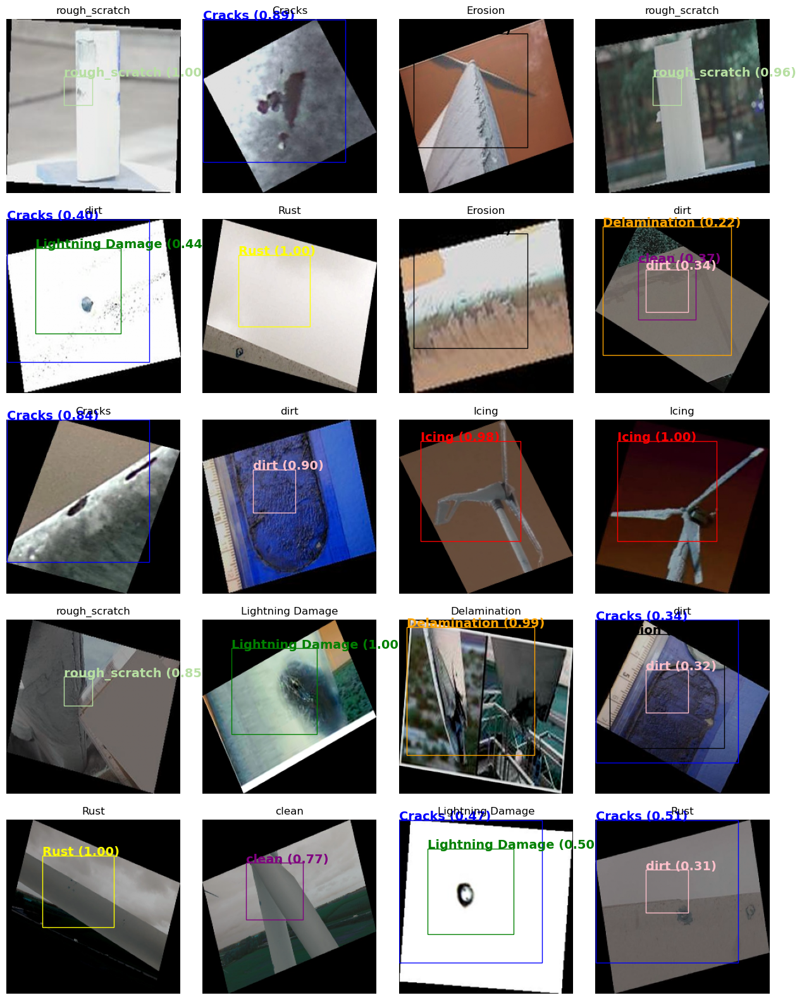

In [33]:
df2 = detect_faultsdf(Inception_ResNet_V2_model, imglist,labels,img_size)

In [35]:
df2

,Image,Ground Truth Label,Predicted Label,Confidence
0,resized_synthetic_1613.jpg,rough_scratch,rough_scratch,1.00
1,resized_synthetic_2389.jpg,Cracks,Cracks,0.89
2,resized_synthetic_1235.jpg,Erosion,Erosion,1.00
3,resized_synthetic_2046.jpg,rough_scratch,rough_scratch,0.96
4,resized_synthetic_2033.jpg,dirt,"Cracks,Lightning Damage","0.40,0.44"
5,resized_synthetic_652.jpg,Rust,Rust,1.00
6,resized_synthetic_2424.jpg,Erosion,Erosion,0.99
7,resized_synthetic_1321.jpg,dirt,"Delamination,clean,dirt","0.22,0.37,0.34"
8,resized_synthetic_201.jpg,Cracks,Cracks,0.84
9,resized_synthetic_1922.jpg,dirt,dirt,0.90


Training indexes
                      first  lowest  highest    last
training loss        0.8091  0.3333   0.8091  0.3333
training accuracy    0.7281  0.7281   0.8869  0.8869
validation loss      0.3779  0.2169   0.3779  0.2169
validation accuracy  0.8734  0.8734   0.9250  0.9246 



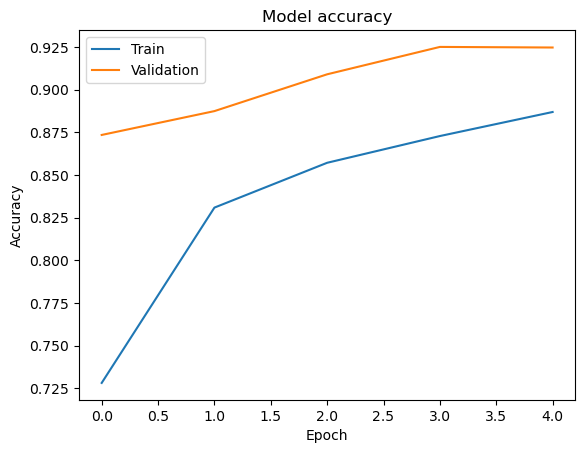

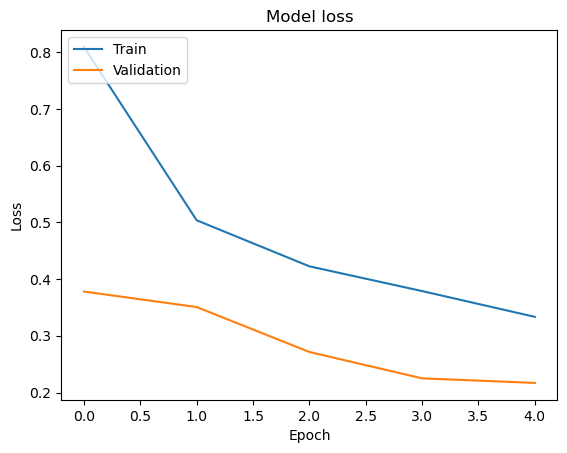

Found 2907 images belonging to 9 classes.

 Evaluate the model on the test set
91/91 [==============================] - 15s 134ms/step - loss: 0.2764 - accuracy: 0.9040
Test loss: 0.2764108180999756
Test accuracy: 0.9040247797966003
91/91 [==============================] - 13s 128ms/step
[0 0 0 ... 8 8 8]
[[9.9937063e-01 7.7069423e-08 1.7525035e-06 ... 3.7021257e-06
  2.9398632e-04 9.1278139e-08]
 [5.2141899e-04 2.4178748e-06 1.4751869e-06 ... 3.1619745e-08
  1.7460269e-03 5.3115641e-09]
 [9.7678751e-01 2.7059814e-05 1.2012697e-04 ... 5.8152988e-03
  1.0764432e-02 8.7772385e-04]
 ...
 [1.5216443e-01 7.1026880e-04 2.5808306e-02 ... 1.8863744e-03
  2.7394637e-02 7.9169822e-01]
 [9.2644477e-06 7.6327837e-05 2.0831167e-06 ... 2.4809822e-06
  3.6715287e-06 9.9990618e-01]
 [1.0855125e-07 5.7607042e-03 2.4208543e-08 ... 6.0816056e-08
  4.6720007e-08 9.9423909e-01]]


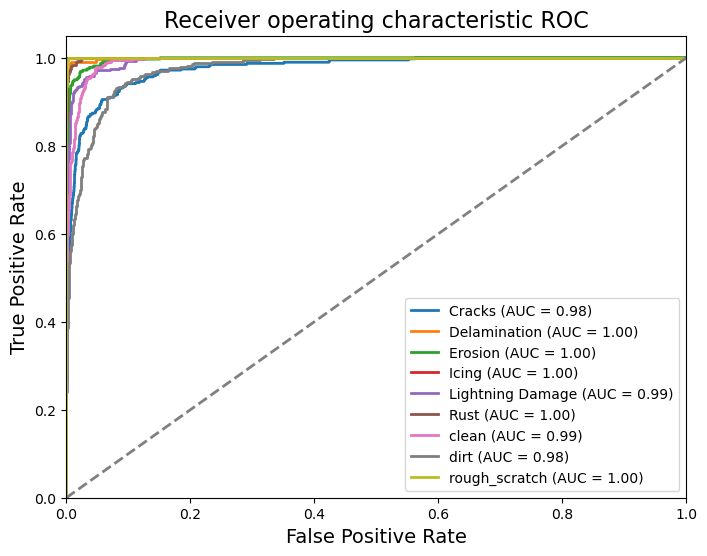

clases: 
 ['Cracks', 'Delamination', 'Erosion', 'Icing', 'Lightning Damage', 'Rust', 'clean', 'dirt', 'rough_scratch']
 
Confusion matrix:
 [[322   5  15   0  19   0  11  17   1]
 [  0 311   0   1   0   0   0   1   3]
 [ 16   3 298   0   0   0   0   0   1]
 [  0   0   0 304   0   0   0   0   0]
 [ 12   1   0   0 290   0   3   7   0]
 [  5   1   0   0  11 267  10   9   0]
 [  2   3   0   0   4   0 275  33   1]
 [ 25   4   8   1  17   2  25 249   1]
 [  0   0   1   0   0   0   0   0 312]]
 
Classification report:
                   precision    recall  f1-score   support

          Cracks       0.84      0.83      0.83       390
    Delamination       0.95      0.98      0.97       316
         Erosion       0.93      0.94      0.93       318
           Icing       0.99      1.00      1.00       304
Lightning Damage       0.85      0.93      0.89       313
            Rust       0.99      0.88      0.93       303
           clean       0.85      0.86      0.86       318
            dirt 

In [34]:
EvaluateTest(data_folder, Inception_ResNet_V2_model, Inception_ResNet_V2_history, batch_size=32, img_size=256)

# Pridictions

In [1]:
import nbimporter
import import_ipynb

import ModelsListDiffFuntions
from ModelsListDiffFuntions import *

# List all the functions defined in the other notebook
print(dir(ModelsListDiffFuntions))

['Activation', 'Adam', 'BatchNormalization', 'Conv2D', 'Dense', 'Dropout', 'EarlyStopping', 'EvaluateTest', 'Flatten', 'FolderTree', 'GPUtil', 'GlobalAveragePooling2D', 'Image', 'ImageDataGenerator', 'ImageFont', 'InceptionResNetV2', 'InceptionV3', 'Input', 'K', 'LabelBinarizer', 'LeakyReLU', 'LearningRateScheduler', 'List', 'MaxPooling2D', 'Model', 'ModelCheckpoint', 'Path', 'RMSprop', 'ReduceLROnPlateau', 'ResNet101', 'ResNet50', 'SGD', 'Sequential', 'Tuple', 'UpSampling2D', 'VGG16', '__builtins__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'auc', 'average_precision_score', 'calculate_batch_size_steps_per_epoch_and_epochs', 'calculate_batch_size_steps_per_epoch_and_epochsb', 'calculate_steps_per_epoch_and_epochs', 'checkHistory', 'classification_report', 'cm', 'colorsys', 'concatenate', 'confusion_matrix', 'custom_model', 'custom_modelB', 'cv2', 'datetime', 'detect_faults', 'detect_faults1', 'detect_faults2', 'detect_faults3', 'detect_faults4', 'dete

In [2]:
# load the saved model
Custom_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_model_2023-03-06 2238.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Custom_history_2023-03-06 2238.pkl', 'rb') as f:
    Custom_history = pickle.load(f)
    
# load the saved model
Inception_ResNet_V2_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-ResNet-V2_model_2023-03-06 1602.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-ResNet-V2_history_2023-03-06 1602.pkl', 'rb') as f:
    Inception_ResNet_V2_history = pickle.load(f)
    
# load the saved model
Inception_V2_model = load_model('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-V2_model_2023-03-06 0745.h5')
# load the saved history
with open('Models/TrainingData_2023-03-06 0523/wind_turbine_Inception-V2_history_2023-03-06 0745.pkl', 'rb') as f:
    Inception_V2_history = pickle.load(f)

In [3]:
data_folder = check_folder = os.path.join('..', 'data', 'data4d')
check_folder = os.path.join('..', 'data', 'data4c','test')
print(len(check_folder))
# C:\Users\scrwh\Documents\PythonScripts\Master_Thesis\data\data4b\check

batch_size=32
epochs=50
img_size=244

# Retrieve input image size
img_size = Custom_model.layers[0].input_shape[1]

val_datagen = ImageDataGenerator(
    rescale=1./255
)
# test_generator = load_data_generator(val_datagen, data_folder, 'test')
test_generator = load_data_generator(val_datagen, data_folder, 'test', img_size = img_size, batch_size = batch_size)



num_classes = len(test_generator.class_indices)
# labels = train_generator.class_indices
labels = list(test_generator.class_indices.keys())

19
Found 2907 images belonging to 9 classes.


In [4]:

all_filesc = get_file_list(check_folder)
len(all_filesc)

2907

In [5]:
imglist =  random_sample(all_filesc, 5) # random.sample(all_filesc, 5)
imglist

['..\\data\\data4c\\test\\Delamination\\resized_synthetic_2679.jpg',
 '..\\data\\data4c\\test\\Lightning Damage\\resized_synthetic_2227.jpg',
 '..\\data\\data4c\\test\\Delamination\\resized_synthetic_646.jpg',
 '..\\data\\data4c\\test\\Icing\\resized_synthetic_614.jpg',
 '..\\data\\data4c\\test\\Rust\\resized_synthetic_469.jpg']

In [6]:
ImagesFile = '..\\data\\data4c\\test\\Rust\\resized_synthetic_2565.jpg'

In [7]:
labels

['Cracks',
 'Delamination',
 'Erosion',
 'Icing',
 'Lightning Damage',
 'Rust',
 'clean',
 'dirt',
 'rough_scratch']

1/1 [==============================] - 0s 82ms/step


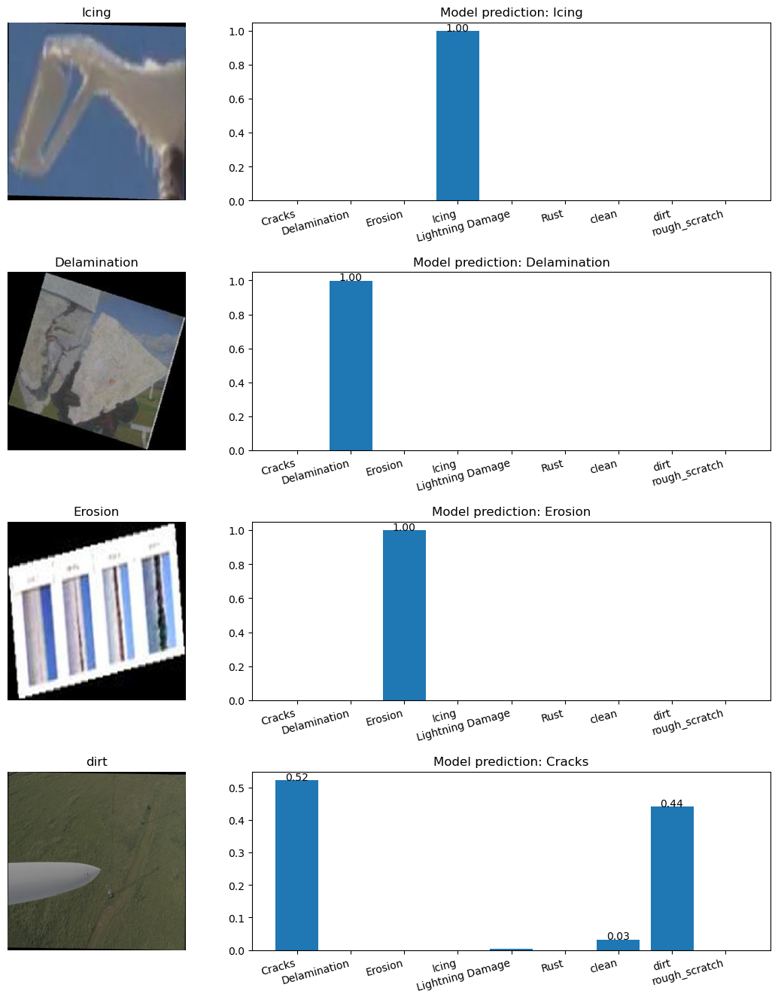

In [51]:
imglist = random_sample(all_filesc, 4) # random.sample(all_filesc, 4)
predictBar(Inception_ResNet_V2_model, imglist, labels, img_size=244)

1/1 [==============================] - 0s 36ms/step


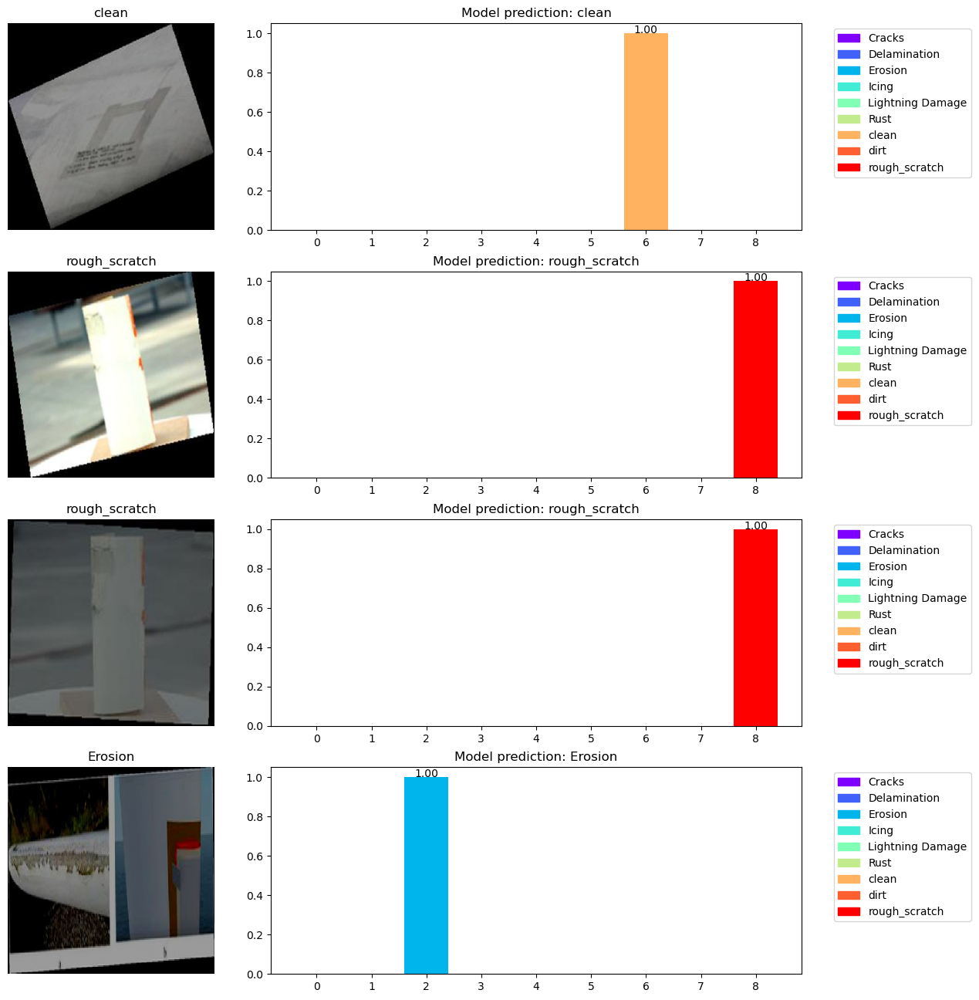

In [9]:
imglist = random_sample(all_filesc, 4) # random.sample(all_filesc, 4)
predictBarColor(Inception_ResNet_V2_model, imglist, labels, img_size=244)

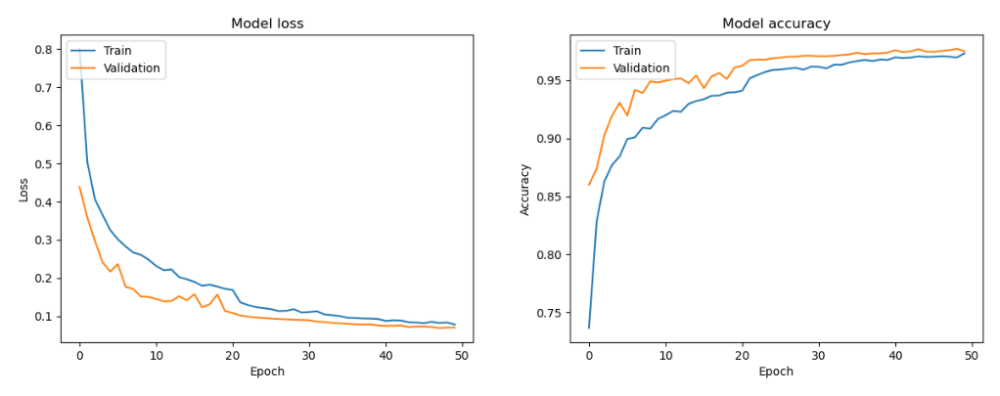

In [50]:
import matplotlib.pyplot as plt
import numpy as np

img_names  = ["loss.png", "accuracy.png"]
img_titles = ["Loss", "Accuracy"]

fig, axs = plt.subplots(nrows=1, ncols=len(img_names), figsize=(20,5))
fig.subplots_adjust(hspace=0.2, wspace=-0.5)

for i, img_name in enumerate(img_names):
    img = plt.imread(img_name)
    axs[i].imshow(img)
    axs[i].axis('off')
    # axs[i].set_title(img_titles[i])

plt.savefig("Loss_Accuracy.png", bbox_inches='tight')